In [1]:
 import zeus21
from matplotlib import pyplot as plt
import numpy as np
import scipy
from scipy.interpolate import interp1d,InterpolatedUnivariateSpline
from matplotlib.gridspec import GridSpec
import matplotlib.lines as mlines

import emcee
import corner
#set up the CLASS cosmology
from classy import Class
ClassCosmo = Class()
ClassCosmo.compute()
import h5py
import sys
sys.path.append('../21cm_ETHOS/21cmFAST-ethos-analysis-main/')
import sheth_tormen as st

from astropy.cosmology import FlatLambdaCDM
from astropy.cosmology import Planck18 as P18
from astropy import constants as const
import astropy.units as u
from datetime import datetime
import pickle
import pathos.pools as pp
from multiprocessing import Pool
import os

os.environ["OMP_NUM_THREADS"] = "1"

In [2]:


#Cosmology


CosmoParams_input = zeus21.Cosmo_Parameters_Input()
ClassyCosmo = zeus21.runclass(CosmoParams_input)
parcos = zeus21.Cosmo_Parameters(CosmoParams_input,ClassyCosmo)
#corrf = zeus21.Correlations(parcos,ClassyCosmo)
 #hmfint = zeus21.HMF_interpolator(parcos,ClassyCosmo)

#Astrophysics


#parastro = zeus21.Astro_Parameters(parcos)

#Temperature

#T21_coeff = zeus21.get_T21_coefficients(parcos, ClassyCosmo, parastro, hmfint, zmin=12) 

In [3]:
corrf = zeus21.Correlations(parcos,ClassyCosmo)
parastro = zeus21.Astro_Parameters(parcos)


In [4]:
parastro = zeus21.Astro_Parameters(parcos)

In [5]:
with open('hmf_dict.pickle', 'rb') as f:
    hmf_dict= pickle.load(f)

In [6]:
zrange = np.array([27.4, 23.4828, 20.5152, 18.1892, 16.3171, 14.7778, 13.4898, \
                   12.3962, 11.4561, 10.6393, 9.92308])

#zrange = np.array([20.5152, 18.1892, 16.3171, 14.7778, 13.4898, \
#12.3962, 11.4561, 10.6393, 9.92308])

krange = np.array([0.1, 0.11, 0.121, 0.1331, 0.14641, 0.161051, 0.177156, \
0.194872, 0.214359, 0.235795, 0.259374, 0.285312, 0.313843, 0.345227, \
0.37975, 0.417725, 0.459497, 0.505447, 0.555992, 0.611591, 0.67275, \
0.740025, 0.814027, 0.89543, 0.984973, 1.08347, 1.19182, 1.311, \
1.4421])

In [19]:
hmf = hmf_dict[0,50]
parastro = zeus21.Astro_Parameters(parcos)
T21_coeff = zeus21.get_T21_coefficients(parcos, ClassyCosmo, parastro,hmf, zmin=10)
powerspec21 = zeus21.Power_Spectra(parcos, ClassCosmo, corrf, T21_coeff, RSD_MODE=1)
obs_PS21 = zeus21.Power_Spectra_Binned(powerspec21, T21_coeff, krange,zrange)
data = obs_PS21.PS21
noise = np.sqrt((data/20.)**2+4**2)

In [22]:
powerspec21._betaxa

array([3.07816633e-03, 3.95730203e-03, 5.14500952e-03, 6.77077749e-03,
       9.01308010e-03, 1.21504733e-02, 1.65560200e-02, 2.28655218e-02,
       3.19084903e-02, 4.49595009e-02, 6.37373407e-02, 9.08161036e-02,
       1.29609871e-01, 1.85048576e-01, 2.63333953e-01, 3.73105706e-01,
       5.25999538e-01, 7.36640170e-01, 1.02596335e+00, 1.42118780e+00,
       1.96001108e+00, 2.69597604e+00, 3.70054558e+00, 5.07923774e+00,
       6.98421684e+00, 9.63405348e+00, 1.33498105e+01, 1.86286188e+01,
       2.62139934e+01, 3.72178796e+01, 5.33865085e+01, 7.74835944e+01,
       1.13880915e+02, 1.69655612e+02, 2.56411471e+02, 3.93472218e+02,
       6.13596709e+02, 9.73162817e+02, 1.57108238e+03, 2.58357749e+03,
       4.33086749e+03, 7.40638143e+03, 1.29328619e+04, 2.30792178e+04,
       4.21254354e+04, 7.87070339e+04, 1.50679432e+05, 2.95928618e+05,
       5.96719640e+05, 1.23663507e+06, 2.63637351e+06, 5.78892456e+06,
       1.31098165e+07, 3.06665289e+07, 7.41576510e+07, 1.85614894e+08,
      

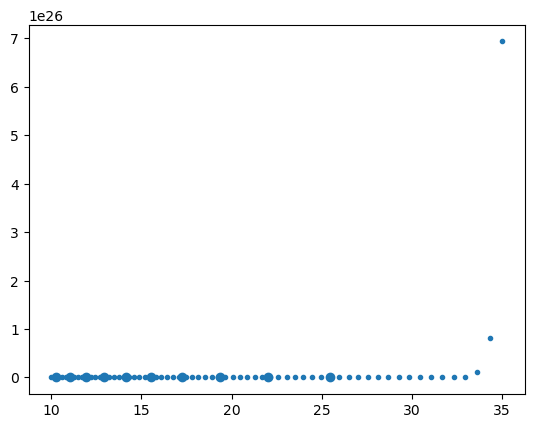

In [10]:
ki = 10
kchoose=obs_PS21.k_center_value[ki]
_ik = min(range(len(powerspec21.klist_PS)), key=lambda i: np.abs(powerspec21.klist_PS[i]-kchoose))

cl = plt.errorbar(obs_PS21.z_center_value, data[:,ki],noise[:,ki],fmt='o')
plt.plot(T21_coeff.zintegral, powerspec21.Deltasq_T21[:,_ik], '.',c=cl[0].get_color())



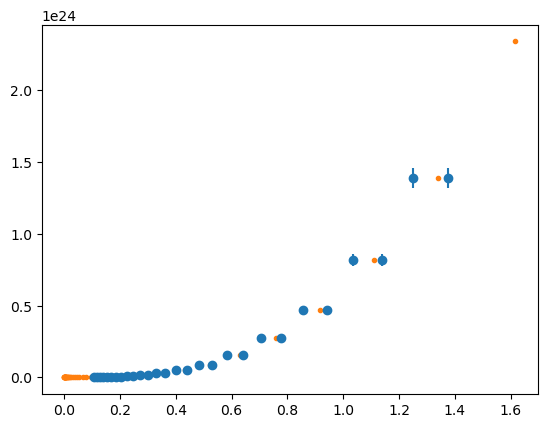

In [11]:
zi = 7
zchoose=obs_PS21.z_center_value[zi]
_iz = min(range(len(T21_coeff.zintegral)), key=lambda i: np.abs(T21_coeff.zintegral[i]-zchoose))
#print(_iz)
#len(powerspec21.klist_PS)
#len(obs_PS21.k_center_value)

cl = plt.errorbar(obs_PS21.k_center_value, data[zi],noise[zi],fmt='o')
plt.plot(powerspec21.klist_PS,powerspec21.Deltasq_T21[_iz],'.')

In [12]:
k_peak_arr = np.array([0,2.5]) #log
h_peak_arr = np.array([0,1.])
alpha_range = np.array([0,3])
eps_range = np.array([-5,0]) #log
L40_range = np.array([-3,3]) #log
E0_range = np.array([2,3]) #log


In [13]:
zeus21.log_posterior([0.32713945, -1.10526393, 1.4760541,   -0.15953819,  4.54462826,  3.44404382], data=data, noise=noise, h_peak_range=h_peak_arr,k_peak_range=k_peak_arr,k_range=krange, z_range=zrange, epsstar_range = eps_range, alphastar_range = alpha_range,
                     L40_xray_range = L40_range, E0_xray_range = E0_range, hmf_dict=hmf_dict, CosmoParams=parcos,ClassCosmo=ClassyCosmo,Correlations=corrf)#,Flag_Only_ETHOS=False)

-inf

In [14]:
a = zeus21.log_posterior([0.5,  2, -1,  0.5,  3,  2.7], data=data, noise=noise, h_peak_range=h_peak_arr,k_peak_range=k_peak_arr,k_range=krange, z_range=zrange, epsstar_range = eps_range, alphastar_range = alpha_range,
                     L40_xray_range = L40_range, E0_xray_range = E0_range, hmf_dict=hmf_dict, CosmoParams=parcos,ClassCosmo=ClassyCosmo,Correlations=corrf)

KeyboardInterrupt: 

In [ ]:
type(a)

numpy.float64

In [ ]:
k_range=krange
z_range=zrange
h_peak_range=h_peak_arr
k_peak_range=k_peak_arr
epsstar_range = eps_range
alphastar_range = alpha_range
L40_xray_range = L40_range
E0_xray_range = E0_range
hmf_dict=hmf_dict
CosmoParams=parcos
ClassCosmo=ClassyCosmo
Correlations=corrf

In [ ]:
alphastar_range

array([0, 3])

In [ ]:
n_walkers = 25
n_steps = 500
n_params = 6
args = [data, noise, k_range, z_range, h_peak_range, k_peak_range, epsstar_range, alphastar_range, L40_xray_range, E0_xray_range, hmf_dict, CosmoParams, ClassCosmo, Correlations]


In [ ]:
h_peak_random = np.random.rand(n_walkers)*(np.max(h_peak_arr) - np.min(h_peak_arr)) + np.min(h_peak_arr)
k_peak_random = np.random.rand(n_walkers)*(np.max(k_peak_arr) - np.min(k_peak_arr)) + np.min(k_peak_arr)
eps_random = np.random.rand(n_walkers)*(np.max(eps_range) - np.min(eps_range)) + np.min(eps_range)
alpha_random = np.random.rand(n_walkers)*(np.max(alpha_range) - np.min(alpha_range)) + np.min(alpha_range)
L40_random = np.random.rand(n_walkers)*(np.max(L40_range) - np.min(L40_range)) + np.min(L40_range)
E0_random= np.random.rand(n_walkers)*(np.max(E0_range) - np.min(E0_range)) + np.min(E0_range)

initial_guesses = np.array([h_peak_random, k_peak_random, eps_random, alpha_random, L40_random, E0_random]).T


In [ ]:
import emcee
import numpy as np
from datetime import datetime
from multiprocessing import Pool
from functools import partial

n_walkers = 25
n_steps = 200
n_params = 6
args = [data, noise, k_range, z_range, h_peak_range, k_peak_range, epsstar_range, alphastar_range, L40_xray_range, E0_xray_range, hmf_dict, CosmoParams, ClassCosmo, Correlations]

initial_guesses = np.array([h_peak_random, k_peak_random, eps_random, alpha_random, L40_random, E0_random]).T


with Pool() as pool:
    sampler = emcee.EnsembleSampler(n_walkers, n_params, zeus21.log_posterior, args=args, pool=pool)
    sampler.run_mcmc(initial_guesses, n_steps, progress=True)


KeyboardInterrupt: 

In [ ]:
from concurrent.futures import ThreadPoolExecutor
from concurrent.futures import ProcessPoolExecutor
n_walkers = 25
n_steps = 500
n_params = 6
args = [data, noise, k_range, z_range, h_peak_range, k_peak_range, epsstar_range, alphastar_range, L40_xray_range, E0_xray_range, hmf_dict, CosmoParams, ClassCosmo, Correlations]

initial_guesses = np.array([h_peak_random, k_peak_random, eps_random, alpha_random, L40_random, E0_random]).T
current_time = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')

n_threads = 12  # Adjust this according to your system's capabilities

with ThreadPoolExecutor(max_workers=n_threads) as executor:
    sampler = emcee.EnsembleSampler(n_walkers, n_params, zeus21.log_posterior, args=args, pool=executor)
    sampler.run_mcmc(initial_guesses, n_steps, progress=True)
np.save(f"samples_{current_time}.npy", sampler.get_chain())

/Users/joverwohlt/Zeus21_ethos/zeus21/sfrd.py:297: RuntimeWarning: invalid value encountered in power
  _xiHirata = pow(_tau_GP*1e-7,1/3.)*pow(self.Tk_avg,-2./3)
100%|██████████| 500/500 [8:32:38<00:00, 61.52s/it]  


In [ ]:

current_time = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
n_walkers = 50
n_steps = 1500
n_params = 6
h_peak_random = np.random.rand(n_walkers)*(np.max(h_peak_arr) - np.min(h_peak_arr)) + np.min(h_peak_arr)
k_peak_random = np.random.rand(n_walkers)*(np.max(k_peak_arr) - np.min(k_peak_arr)) + np.min(k_peak_arr)
eps_random = np.random.rand(n_walkers)*(np.max(eps_range) - np.min(eps_range)) + np.min(eps_range)
alpha_random = np.random.rand(n_walkers)*(np.max(alpha_range) - np.min(alpha_range)) + np.min(alpha_range)
L40_random = np.random.rand(n_walkers)*(np.max(L40_range) - np.min(L40_range)) + np.min(L40_range)
E0_random= np.random.rand(n_walkers)*(np.max(E0_range) - np.min(E0_range)) + np.min(E0_range)

args = [data, noise, k_range, z_range, h_peak_range, k_peak_range, epsstar_range, alphastar_range,cd ../../projects/ku_00155/people/jodamm/Zeus21_ethos/ L40_xray_range, E0_xray_range, hmf_dict, CosmoParams, ClassCosmo, Correlations]
initial_guesses = np.array([h_peak_random, k_peak_random, eps_random, alpha_random, L40_random, E0_random]).T
# Create a ThreadPoolExecuto
sampler = emcee.EnsembleSampler(n_walkers, n_params, zeus21.log_posterior, args=args)
sampler.run_mcmc(initial_guesses, n_steps, progress=True)

np.save(f"samples_{current_time}.npy", sampler.get_chain())

  3%|▎         | 42/1500 [1:27:23<53:52:15, 133.01s/it]

In [ ]:
num_cores = os.cpu_count()
print("Number of CPU cores:", num_cores)

Number of CPU cores: 12


In [ ]:

current_time = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
n_walkers = 20
n_steps = 100
n_params = 6
h_peak_random = np.random.rand(n_walkers)*(np.max(h_peak_arr) - np.min(h_peak_arr)) + np.min(h_peak_arr)
k_peak_random = np.random.rand(n_walkers)*(np.max(k_peak_arr) - np.min(k_peak_arr)) + np.min(k_peak_arr)
eps_random = np.random.rand(n_walkers)*(np.max(eps_range) - np.min(eps_range)) + np.min(eps_range)
alpha_random = np.random.rand(n_walkers)*(np.max(alpha_range) - np.min(alpha_range)) + np.min(alpha_range)
L40_random = np.random.rand(n_walkers)*(np.max(L40_range) - np.min(L40_range)) + np.min(L40_range)
E0_random= np.random.rand(n_walkers)*(np.max(E0_range) - np.min(E0_range)) + np.min(E0_range)
args = [data, noise, k_range, z_range, h_peak_range, k_peak_range, epsstar_range, alphastar_range, L40_xray_range, E0_xray_range, hmf_dict, CosmoParams, ClassCosmo, Correlations]
initial_guesses = np.array([h_peak_random, k_peak_random, eps_random, alpha_random, L40_random, E0_random]).T
# Create a ThreadPoolExecuto



sampler = emcee.EnsembleSampler(n_walkers, n_params, zeus21.log_posterior, args=args,     moves=[
        (emcee.moves.DEMove(), 0.8),
        (emcee.moves.DESnookerMove(), 0.2),
    ],
)
sampler.run_mcmc(initial_guesses, n_steps, progress=True)



/Users/joverwohlt/Zeus21_ethos/zeus21/correlations.py:236: RuntimeWarning: divide by zero encountered in divide
  self._betaxa = 1./(1. + T21_coefficients.xa_avg)/T21_coefficients.xa_avg #multiplies \delta x_a [again not \delta xa/xa]
 25%|██▌       | 25/100 [10:17<40:59, 32.80s/it]/Users/joverwohlt/Zeus21_ethos/zeus21/sfrd.py:297: RuntimeWarning: invalid value encountered in power
  _xiHirata = pow(_tau_GP*1e-7,1/3.)*pow(self.Tk_avg,-2./3)
100%|██████████| 100/100 [51:02<00:00, 30.63s/it]


State([[ 0.01397096  1.8598101  -1.98614259  0.0781393   1.37480331  2.69894829]
 [ 0.00361417  2.38230807 -1.06649304  0.65594906  1.73881608  2.4286321 ]
 [ 0.54966438  1.82266483 -1.3476669   0.3950452   2.54449587  2.51696153]
 [ 0.09123098  2.17023841 -1.0571164   0.52657849  0.75307657  2.81454355]
 [ 0.93164095  1.94742873 -0.72429019  0.79514042  2.18502389  2.36963696]
 [ 0.18357958  1.96108642 -2.54947683  0.16937274  1.58138054  2.47961489]
 [ 0.08159352  2.42654063 -0.54959266  0.7792584   1.956539    2.32597812]
 [ 0.19853475  1.89188398 -2.48180675  0.05373092  1.12053379  2.7688822 ]
 [ 0.42924706  2.39202848 -1.37118471  0.59241269  2.0059501   2.27468988]
 [ 0.01966416  2.02716965 -0.97156294  0.54682677  1.07312177  2.59797342]
 [ 0.75395231  1.87419563 -1.07738135  0.51682879  2.02314444  2.54920933]
 [ 0.07076929  2.44795392 -0.39490991  0.84375109  1.96475351  2.31367202]
 [ 0.07729272  2.21343283 -0.46836398  1.01372038  2.15062243  2.34339948]
 [ 0.37896776  2.14

In [ ]:
np.save(f"samples_{current_time}.npy", sampler.get_chain())

current_time = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
with Pool() as pool:
    sampler = emcee.EnsembleSampler(n_walkers, n_params, zeus21.log_posterior, args=args, pool=pool)#, threads=ncores)
   
    sampler.run_mcmc(initial_guesses, n_steps, rogress=pFalse)
    start = time.time()
    sampler.run_mcmc(initial, nsteps, progress=True)
    end = time.time()
    multi_time = end - start
    print("Multiprocessing took {0:.1f} seconds".format(multi_time))
    print("{0:.1f} times faster than serial".format(serial_time / multi_time))

In [ ]:


np.save(f"samples_{current_time}.npy", sampler.get_chain())

In [ ]:
samples = np.load('samples_2023-08-22_14-16-55.npy')

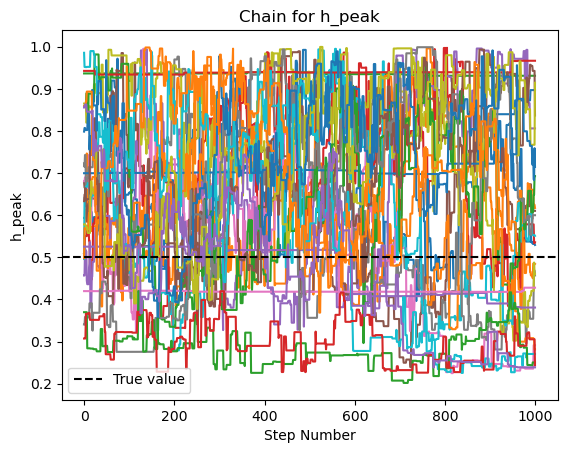

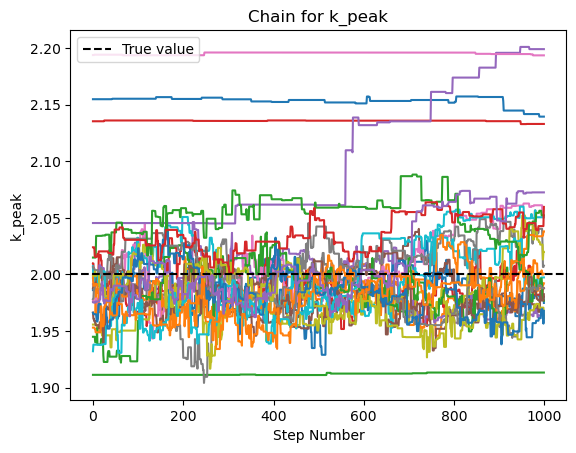

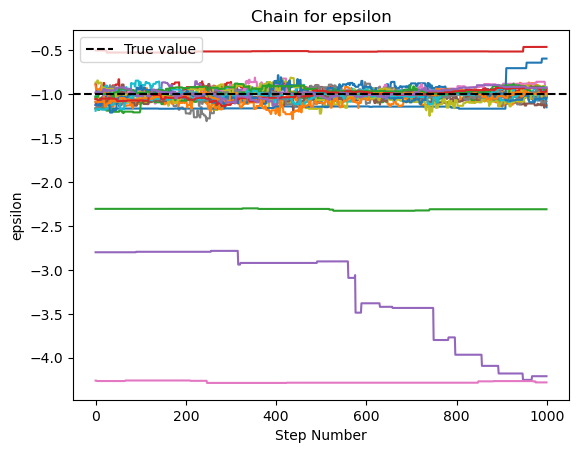

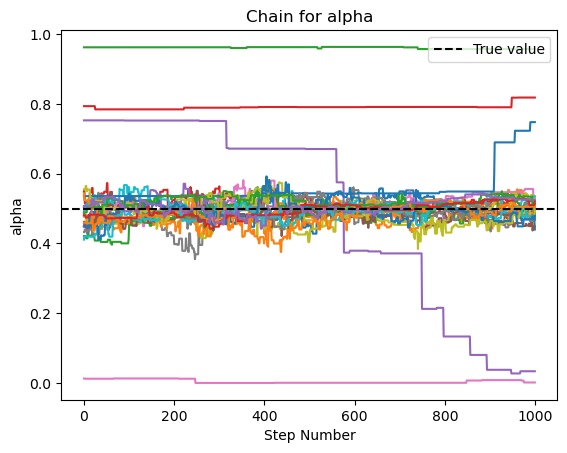

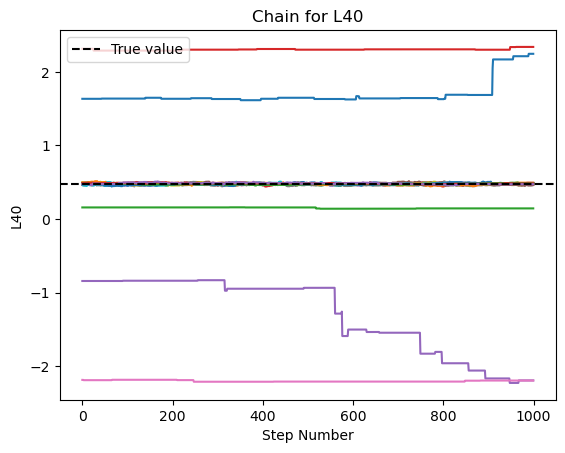

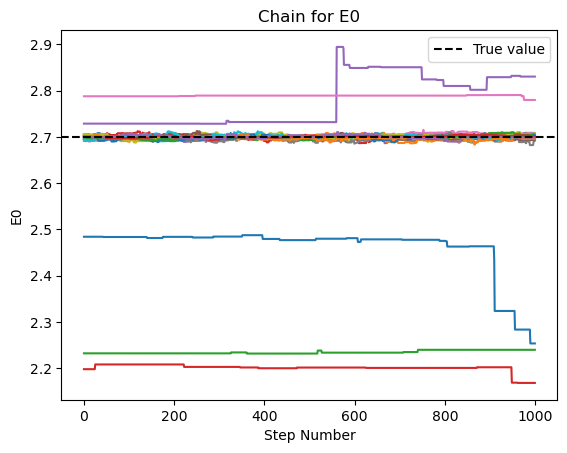

In [ ]:


n_burn = 1000
def chain_plots(chain, parameter_labels, parameter_truths, **kwargs):
    """
    Plot the histories for each walker in the chain
    
    Parameters
    ----------
    chain: ndarray
        3D array with shape (n_walkers, n_steps, n_params)
    parameter_labels: list
        List of labels for each parameter
    parameter_truths: list
        List of true values for each parameter
    kwargs: `.Line2D` properties, optional
        All keyword arguments are passed to `pyplot.plot`
    """
    n_walkers, n_steps, n_params = chain.shape  # Calculate the number of parameters

    for param_idx in range(n_params):
        plt.figure()
        plt.plot(chain[n_burn:, :, param_idx], **kwargs)
        plt.axhline(y=parameter_truths[param_idx], color='k', linestyle='--', label='True value')
        plt.xlabel('Step Number')
        plt.ylabel(parameter_labels[param_idx])
        plt.title(f'Chain for {parameter_labels[param_idx]}')
        plt.legend()
        plt.show()  # Show the plot for each parameter

# Load the samples from the file
samples = np.load('samples_2023-08-30_14-03-44.npy')

# Define parameter labels and truth values
parameter_labels = ['h_peak', 'k_peak', 'epsilon', 'alpha', 'L40', 'E0']
parameter_truths = [0.5, 2, -1, 0.5, 0.477, 2.69897]

# Call the chain_plots function with the loaded samples and parameter information
chain_plots(samples, parameter_labels, parameter_truths)

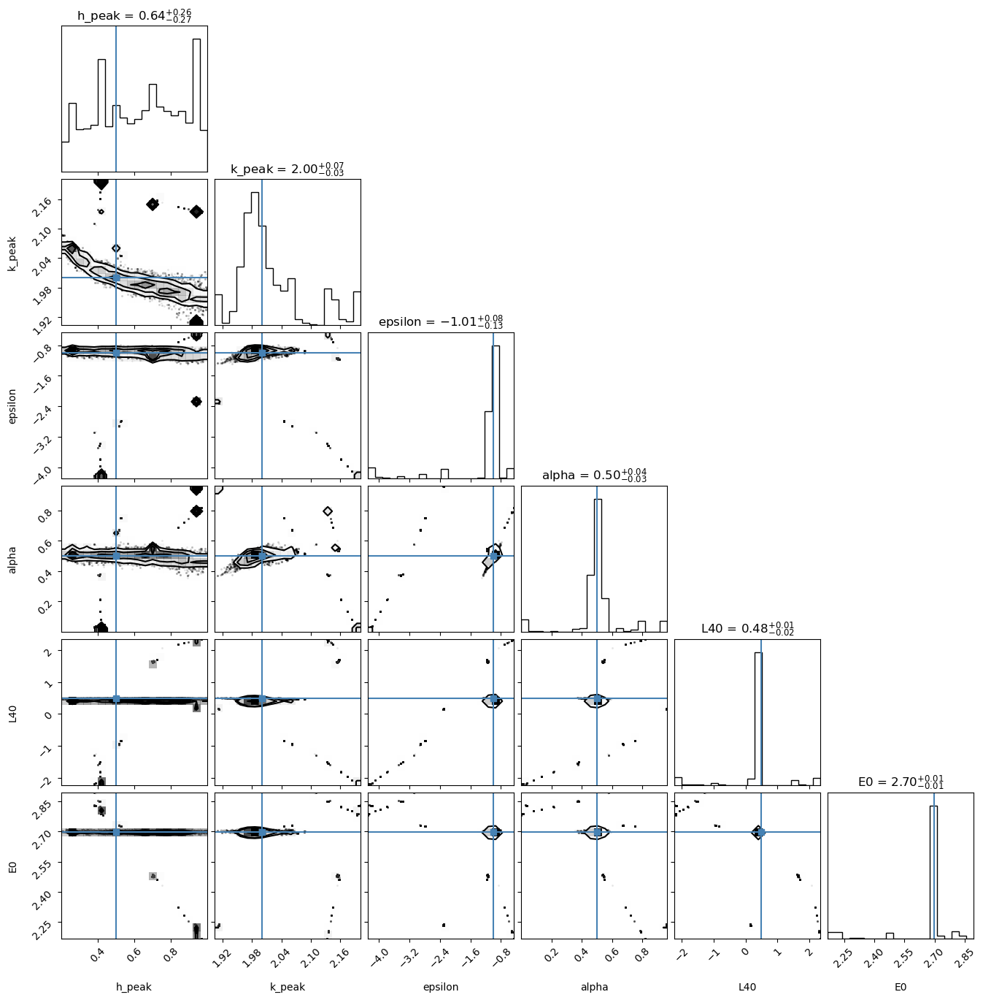

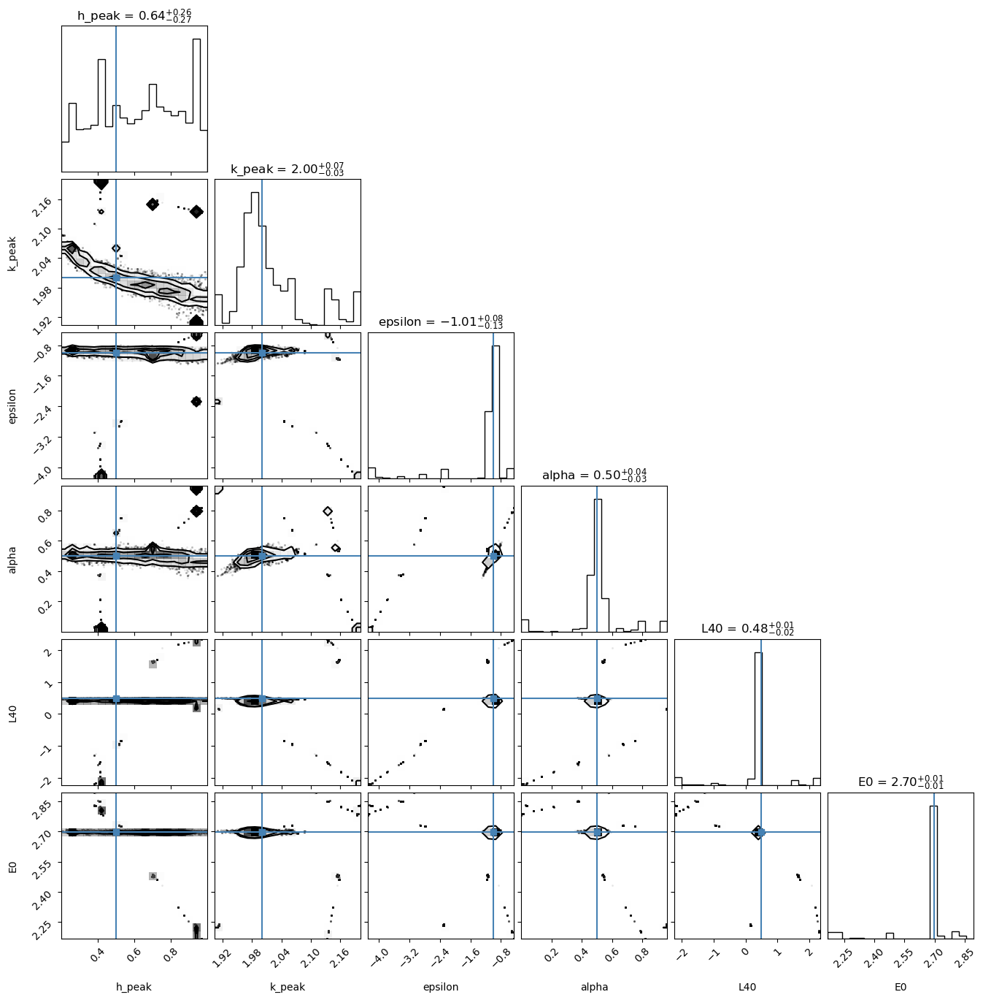

In [ ]:
n_burn = 1200

# Load the saved chain
chain = np.load('samples_2023-08-30_14-03-44.npy')

# Get the dimensions of the chain
num_walkers, num_samples, num_parameters = chain.shape

# Reshape the chain to combine walkers and samples
flatchain = chain[n_burn:,:,:].reshape(-1, num_parameters)

# Define labels for the parameters
parameter_labels = ['h_peak', 'k_peak', 'epsilon', 'alpha', 'L40', 'E0']

# Define truths for the parameters
parameter_truths = [0.5, 2, -1, 0.5, 0.477, 2.69897]

# Create a corner plot
corner.corner(flatchain, labels=parameter_labels, truths=parameter_truths, show_titles=True)


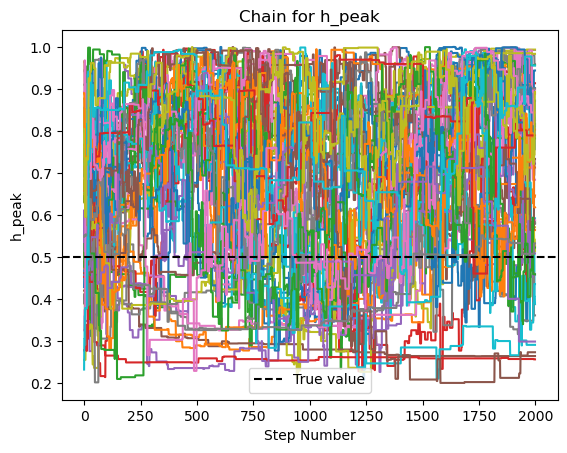

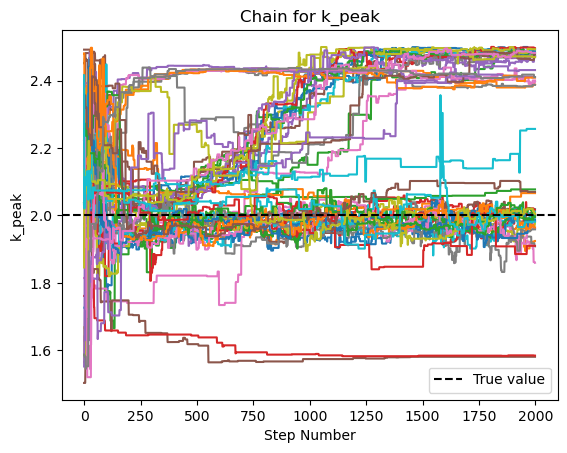

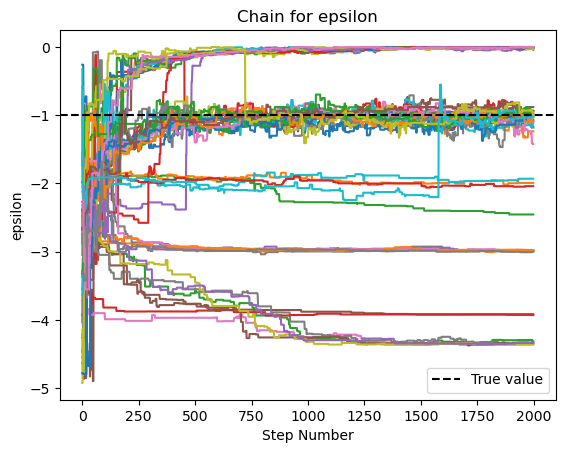

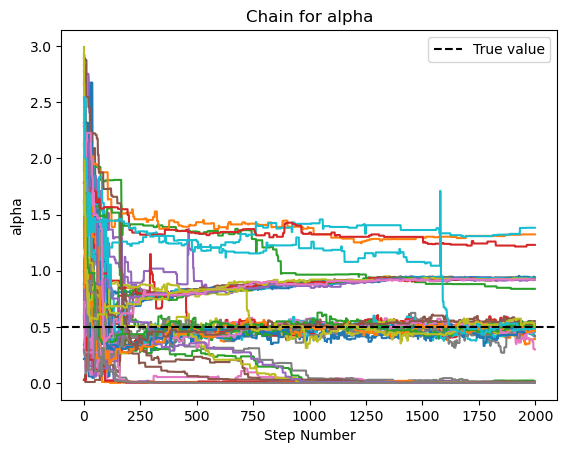

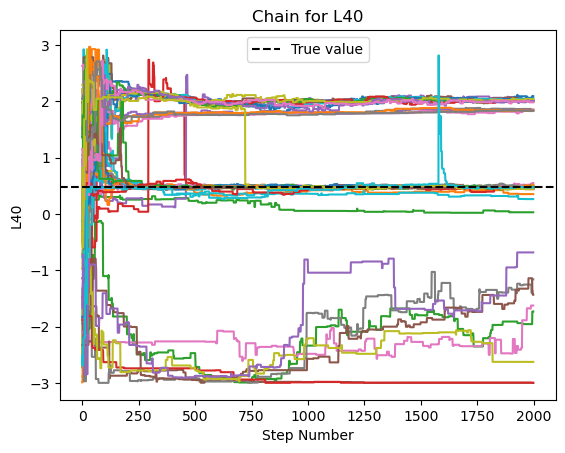

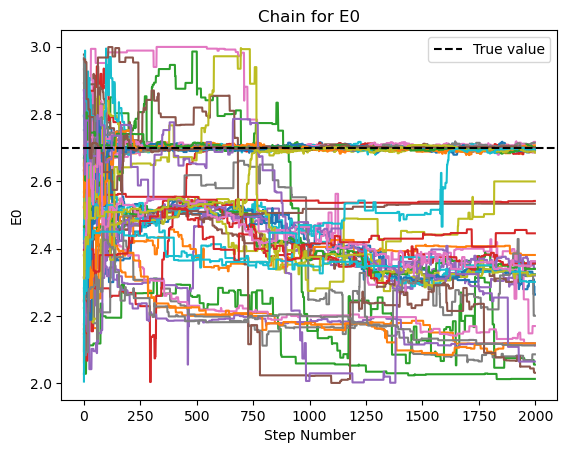

In [ ]:


n_burn = 1

def chain_plots(chain, parameter_labels, parameter_truths, **kwargs):
    """
    Plot the histories for each walker in the chain
    
    Parameters
    ----------
    chain: ndarray
        3D array with shape (n_walkers, n_steps, n_params)
    parameter_labels: list
        List of labels for each parameter
    parameter_truths: list
        List of true values for each parameter
    kwargs: `.Line2D` properties, optional
        All keyword arguments are passed to `pyplot.plot`
    """
    n_walkers, n_steps, n_params = chain.shape  # Calculate the number of parameters

    for param_idx in range(n_params):
        plt.figure()
        plt.plot(chain[n_burn:, :, param_idx], **kwargs)
        plt.axhline(y=parameter_truths[param_idx], color='k', linestyle='--', label='True value')
        plt.xlabel('Step Number')
        plt.ylabel(parameter_labels[param_idx])
        plt.title(f'Chain for {parameter_labels[param_idx]}')
        plt.legend()
        plt.show()  # Show the plot for each parameter

# Load the samples from the file
samples = np.load('samples_2023-08-25_17-06-28.npy')

# Define parameter labels and truth values
parameter_labels = ['h_peak', 'k_peak', 'epsilon', 'alpha', 'L40', 'E0']
parameter_truths = [0.5, 2, -1, 0.5, 0.477, 2.69897]

# Call the chain_plots function with the loaded samples and parameter information
chain_plots(samples, parameter_labels, parameter_truths)


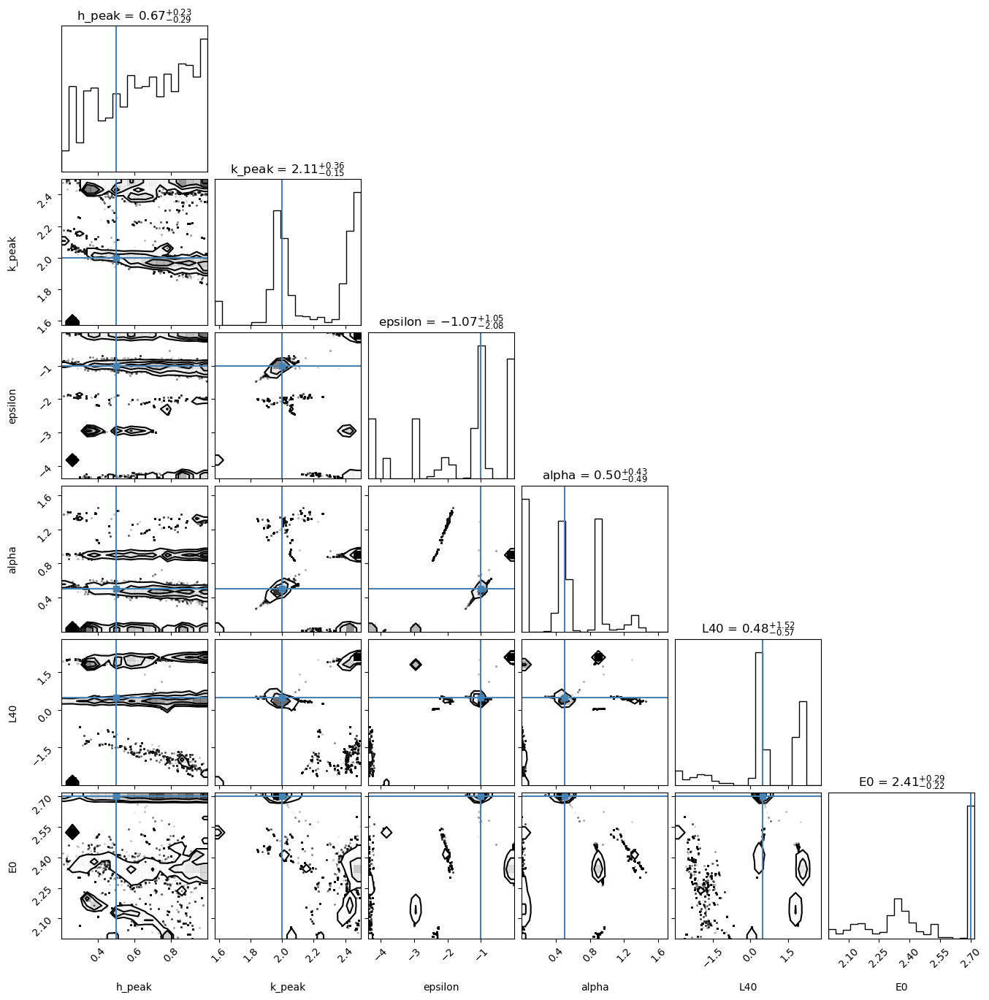

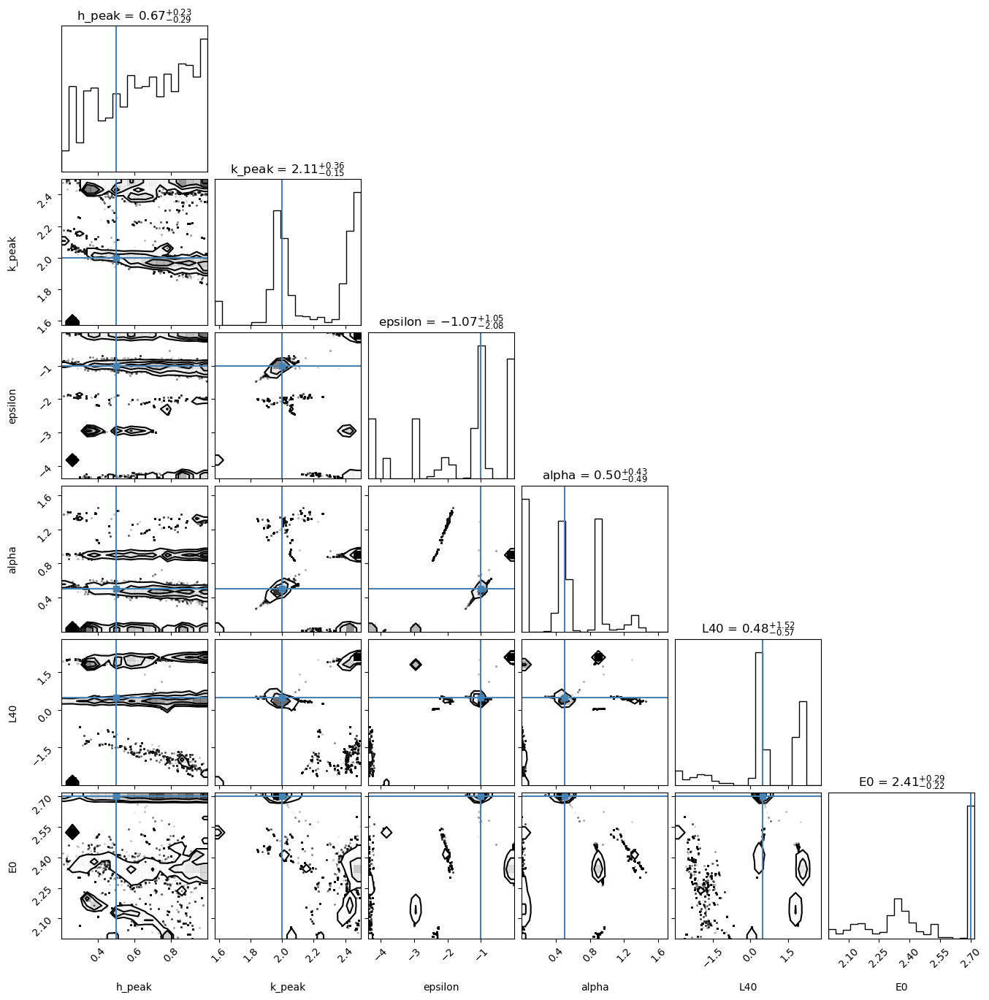

In [ ]:
n_burn = 1000

# Load the saved chain
chain = np.load('samples_2023-08-25_17-06-28.npy')

# Get the dimensions of the chain
num_walkers, num_samples, num_parameters = chain.shape

# Reshape the chain to combine walkers and samples
flatchain = chain[n_burn:,:,:].reshape(-1, num_parameters)

# Define labels for the parameters
parameter_labels = ['h_peak', 'k_peak', 'epsilon', 'alpha', 'L40', 'E0']

# Define truths for the parameters
parameter_truths = [0.5, 2, -1, 0.5, 0.477, 2.69897]

# Create a corner plot
corner.corner(flatchain, labels=parameter_labels, truths=parameter_truths, show_titles=True)


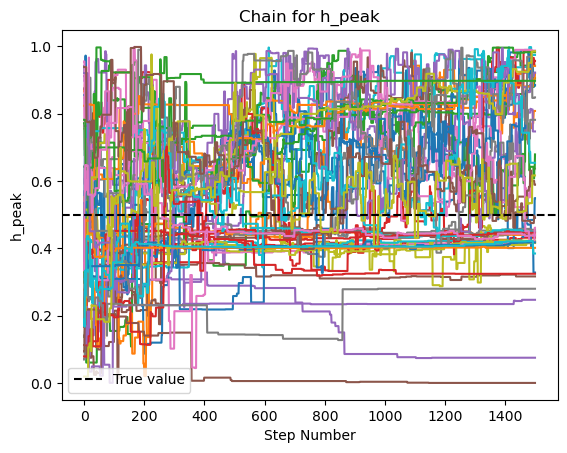

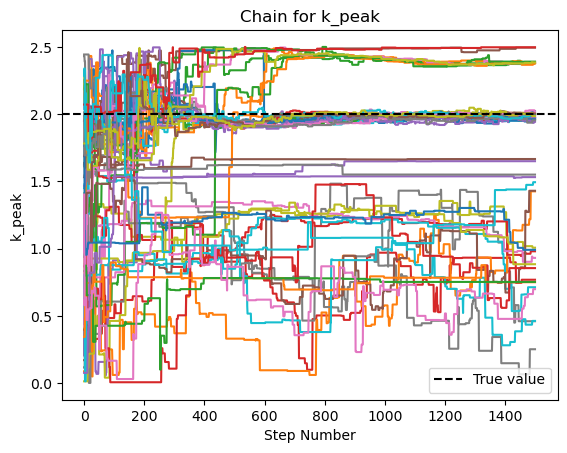

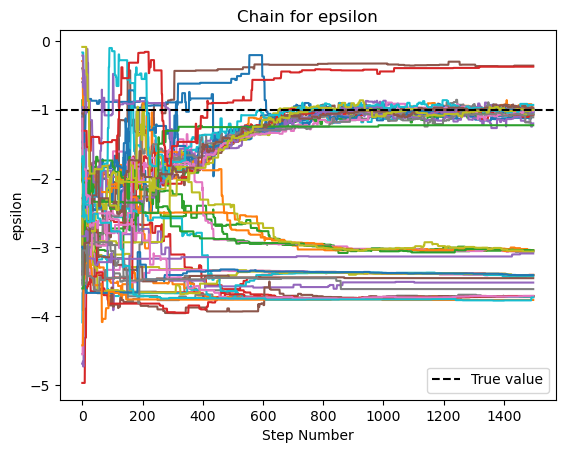

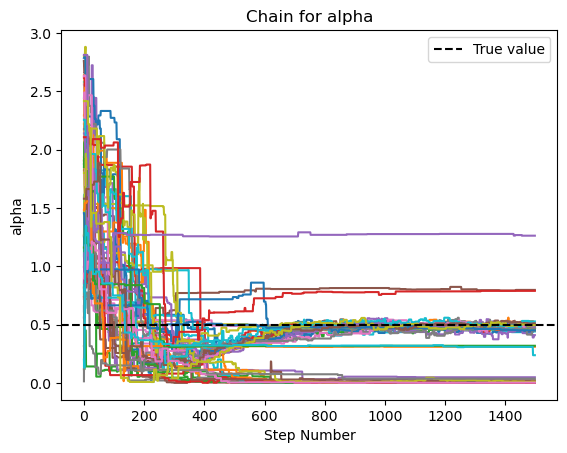

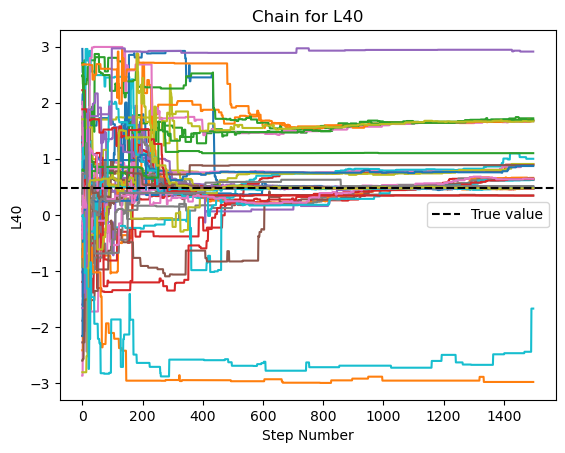

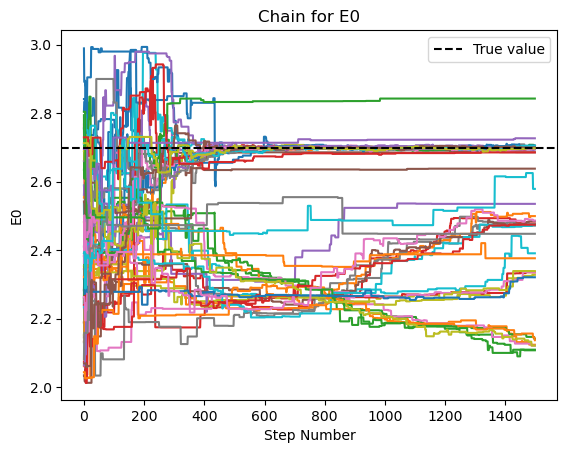

In [ ]:


n_burn = 1

def chain_plots(chain, parameter_labels, parameter_truths, **kwargs):
    """
    Plot the histories for each walker in the chain
    
    Parameters
    ----------
    chain: ndarray
        3D array with shape (n_walkers, n_steps, n_params)
    parameter_labels: list
        List of labels for each parameter
    parameter_truths: list
        List of true values for each parameter
    kwargs: `.Line2D` properties, optional
        All keyword arguments are passed to `pyplot.plot`
    """
    n_walkers, n_steps, n_params = chain.shape  # Calculate the number of parameters

    for param_idx in range(n_params):
        plt.figure()
        plt.plot(chain[n_burn:, :, param_idx], **kwargs)
        plt.axhline(y=parameter_truths[param_idx], color='k', linestyle='--', label='True value')
        plt.xlabel('Step Number')
        plt.ylabel(parameter_labels[param_idx])
        plt.title(f'Chain for {parameter_labels[param_idx]}')
        plt.legend()
        plt.show()  # Show the plot for each parameter

# Load the samples from the file
samples = np.load('samples_2023-08-31_14-01-09.npy')

# Define parameter labels and truth values
parameter_labels = ['h_peak', 'k_peak', 'epsilon', 'alpha', 'L40', 'E0']
parameter_truths = [0.5, 2, -1, 0.5, 0.477, 2.69897]

# Call the chain_plots function with the loaded samples and parameter information
chain_plots(samples, parameter_labels, parameter_truths)


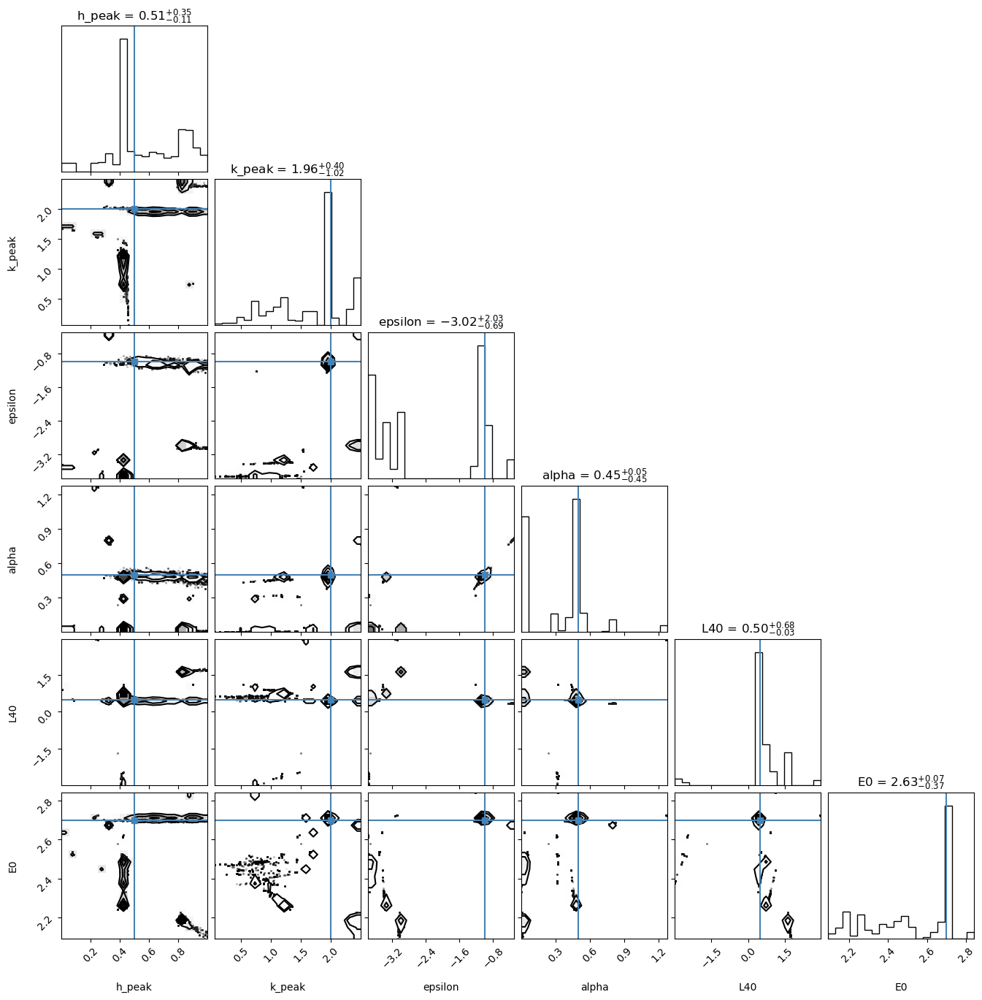

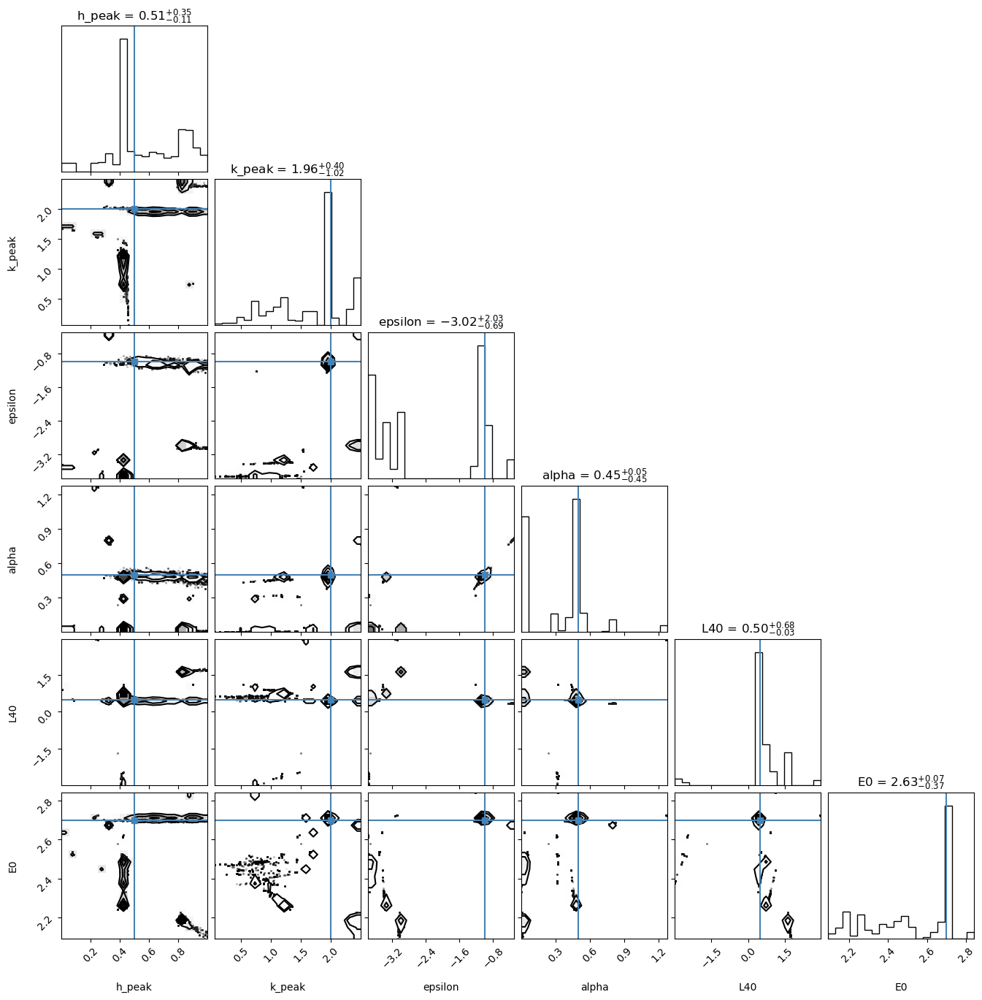

In [ ]:
import seaborn as sns
sns.set_palette("flare")

n_burn = 1000

# Load the saved chain
chain = np.load('samples_2023-08-31_14-01-09.npy')

# Get the dimensions of the chain
num_walkers, num_samples, num_parameters = chain.shape

# Reshape the chain to combine walkers and samples
flatchain = chain[n_burn:,:,:].reshape(-1, num_parameters)

# Define labels for the parameters
parameter_labels = ['h_peak', 'k_peak', 'epsilon', 'alpha', 'L40', 'E0']

# Define truths for the parameters
parameter_truths = [0.5, 2, -1, 0.5, 0.477, 2.69897]

# Create a corner plot
corner.corner(flatchain, labels=parameter_labels, truths=parameter_truths, show_titles=True)


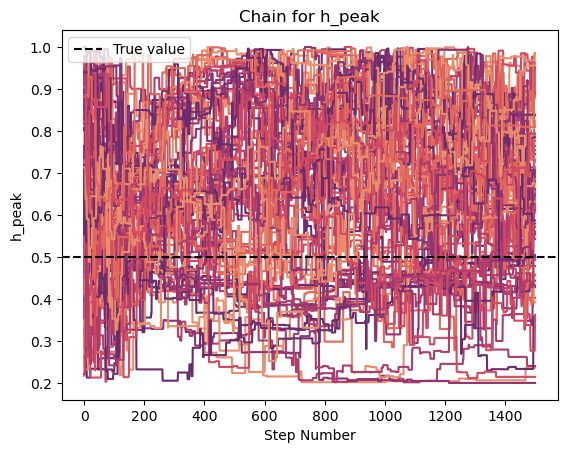

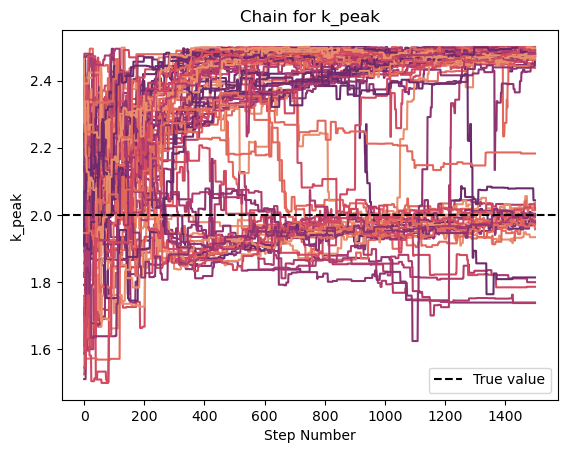

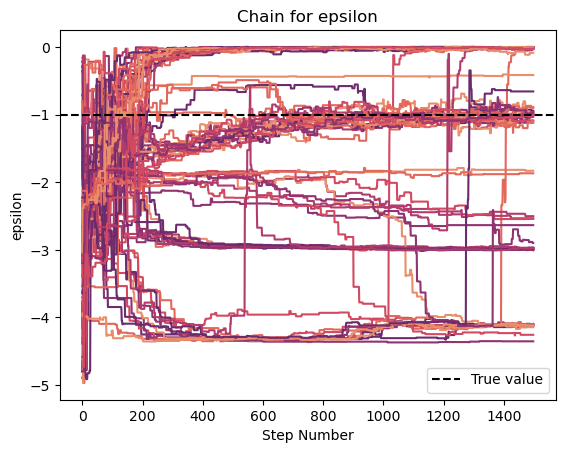

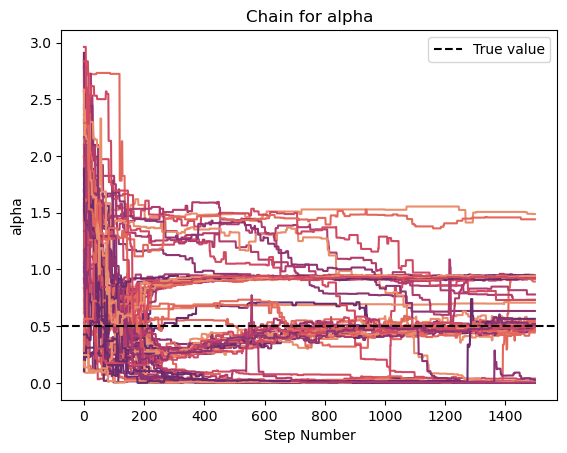

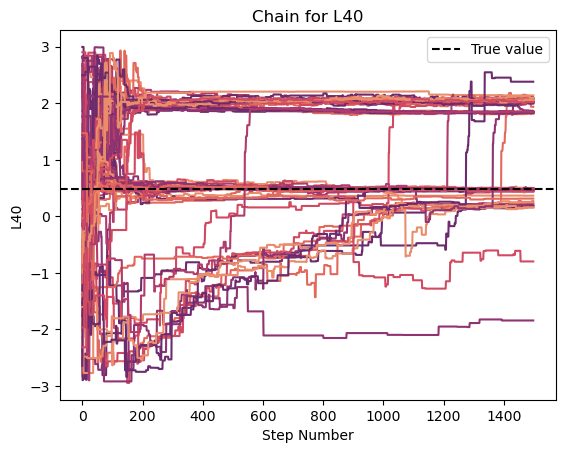

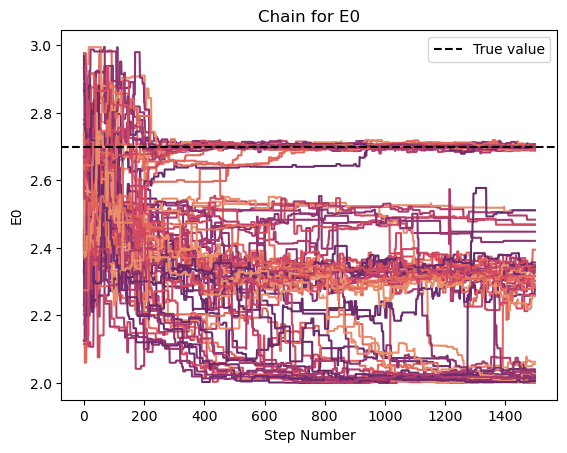

In [ ]:


n_burn = 1

def chain_plots(chain, parameter_labels, parameter_truths, **kwargs):
    """
    Plot the histories for each walker in the chain
    
    Parameters
    ----------
    chain: ndarray
        3D array with shape (n_walkers, n_steps, n_params)
    parameter_labels: list
        List of labels for each parameter
    parameter_truths: list
        List of true values for each parameter
    kwargs: `.Line2D` properties, optional
        All keyword arguments are passed to `pyplot.plot`
    """
    n_walkers, n_steps, n_params = chain.shape  # Calculate the number of parameters

    for param_idx in range(n_params):
        plt.figure()
        plt.plot(chain[n_burn:, :, param_idx], **kwargs)
        plt.axhline(y=parameter_truths[param_idx], color='k', linestyle='--', label='True value')
        plt.xlabel('Step Number')
        plt.ylabel(parameter_labels[param_idx])
        plt.title(f'Chain for {parameter_labels[param_idx]}')
        plt.legend()
        plt.show()  # Show the plot for each parameter

# Load the samples from the file
samples = np.load('samples_othersteps_2023-09-01_15-59-25.npy')

# Define parameter labels and truth values
parameter_labels = ['h_peak', 'k_peak', 'epsilon', 'alpha', 'L40', 'E0']
parameter_truths = [0.5, 2, -1, 0.5, 0.477, 2.69897]

# Call the chain_plots function with the loaded samples and parameter information
chain_plots(samples, parameter_labels, parameter_truths)


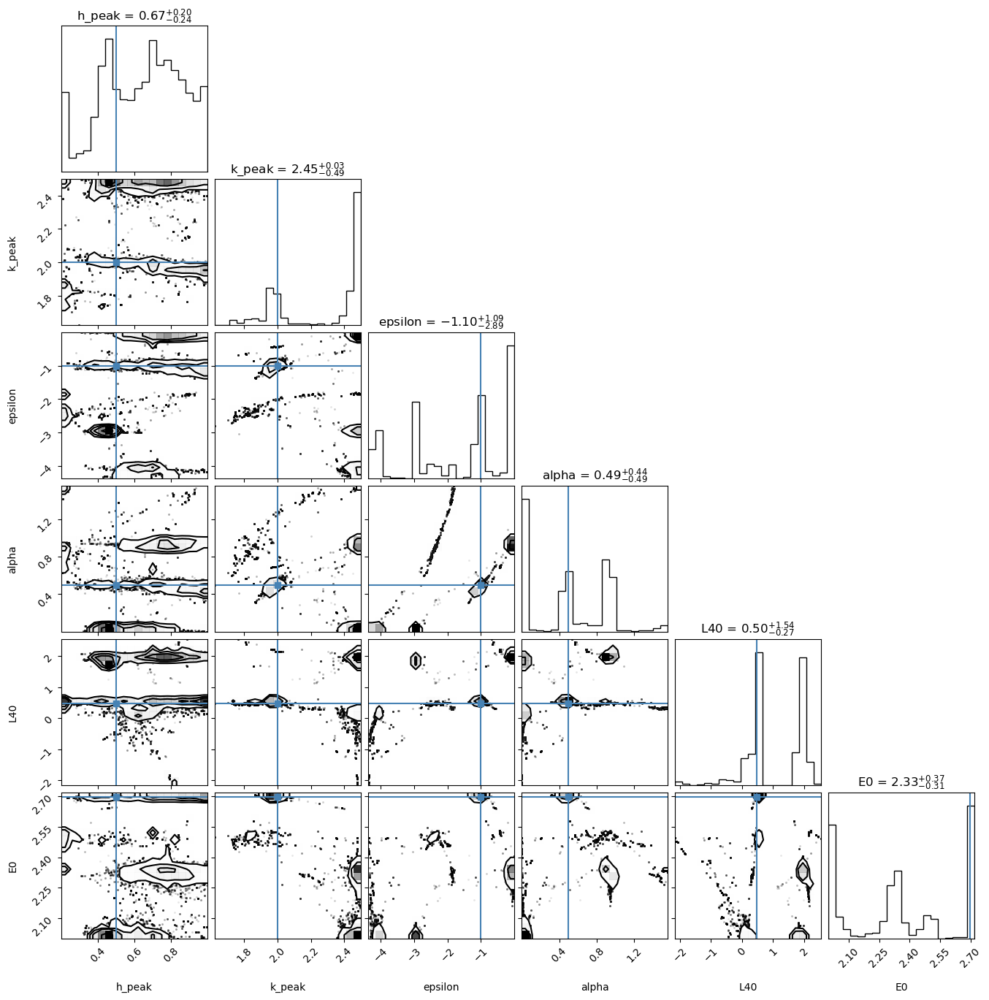

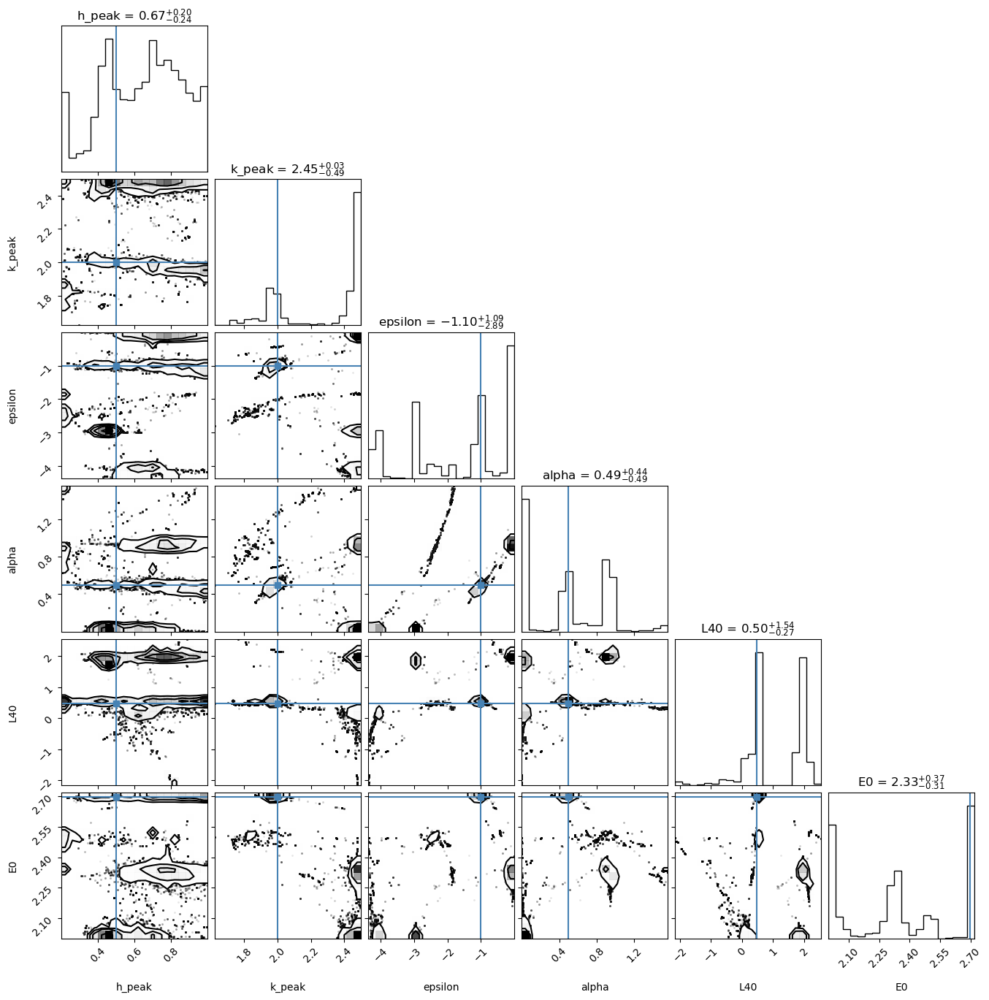

In [ ]:


# Load the saved chain
chain = np.load('samples_othersteps_2023-09-01_15-59-25.npy')

# Get the dimensions of the chain
num_walkers, num_samples, num_parameters = chain.shape

# Reshape the chain to combine walkers and samples
flatchain = chain[n_burn:,:,:].reshape(-1, num_parameters)

# Define labels for the parameters
parameter_labels = ['h_peak', 'k_peak', 'epsilon', 'alpha', 'L40', 'E0']

# Define truths for the parameters
parameter_truths = [0.5, 2, -1, 0.5, 0.477, 2.69897]

# Create a corner plot
corner.corner(flatchain, labels=parameter_labels, truths=parameter_truths, show_titles=True)


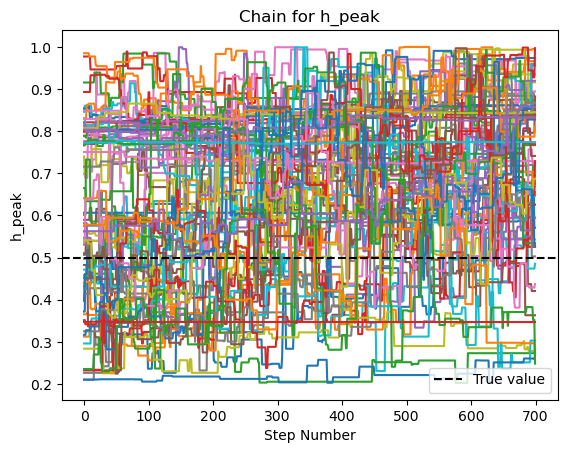

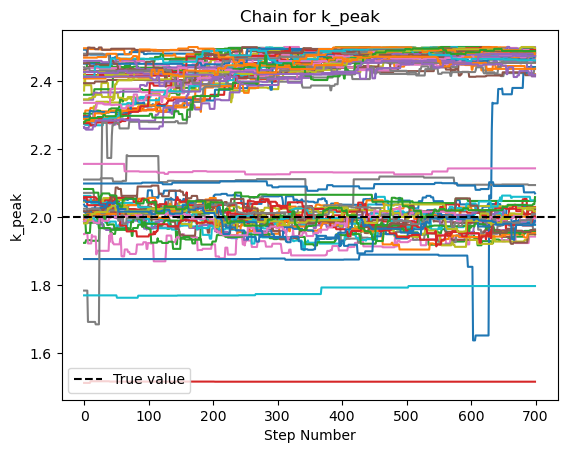

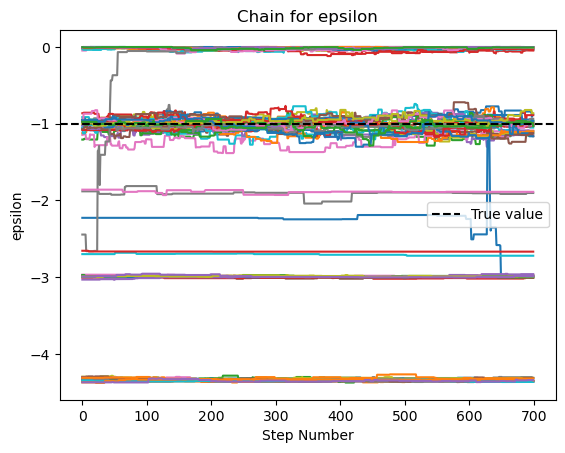

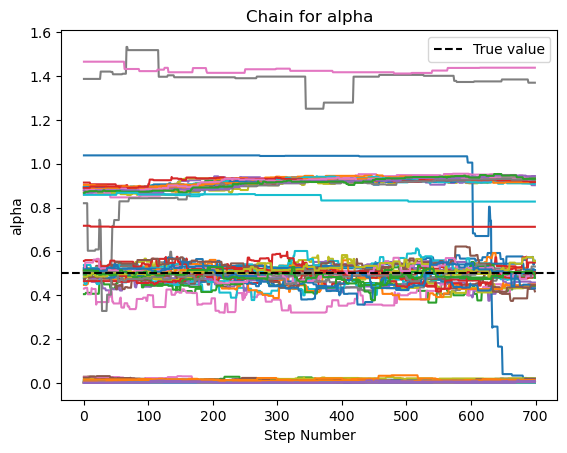

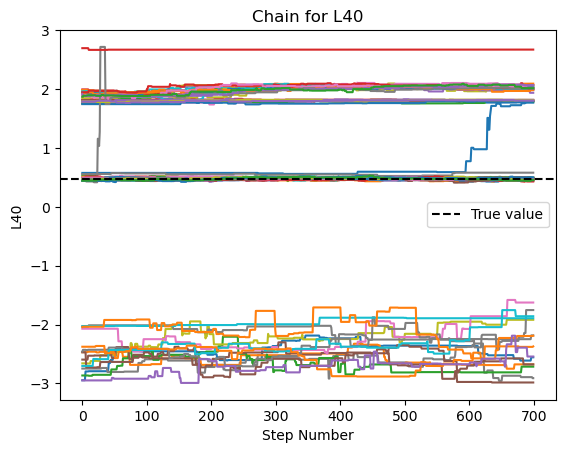

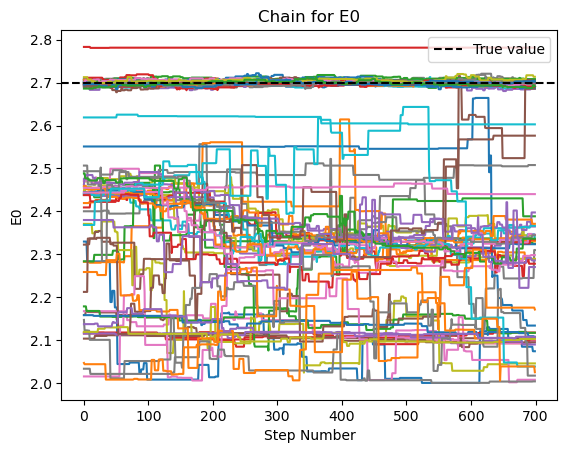

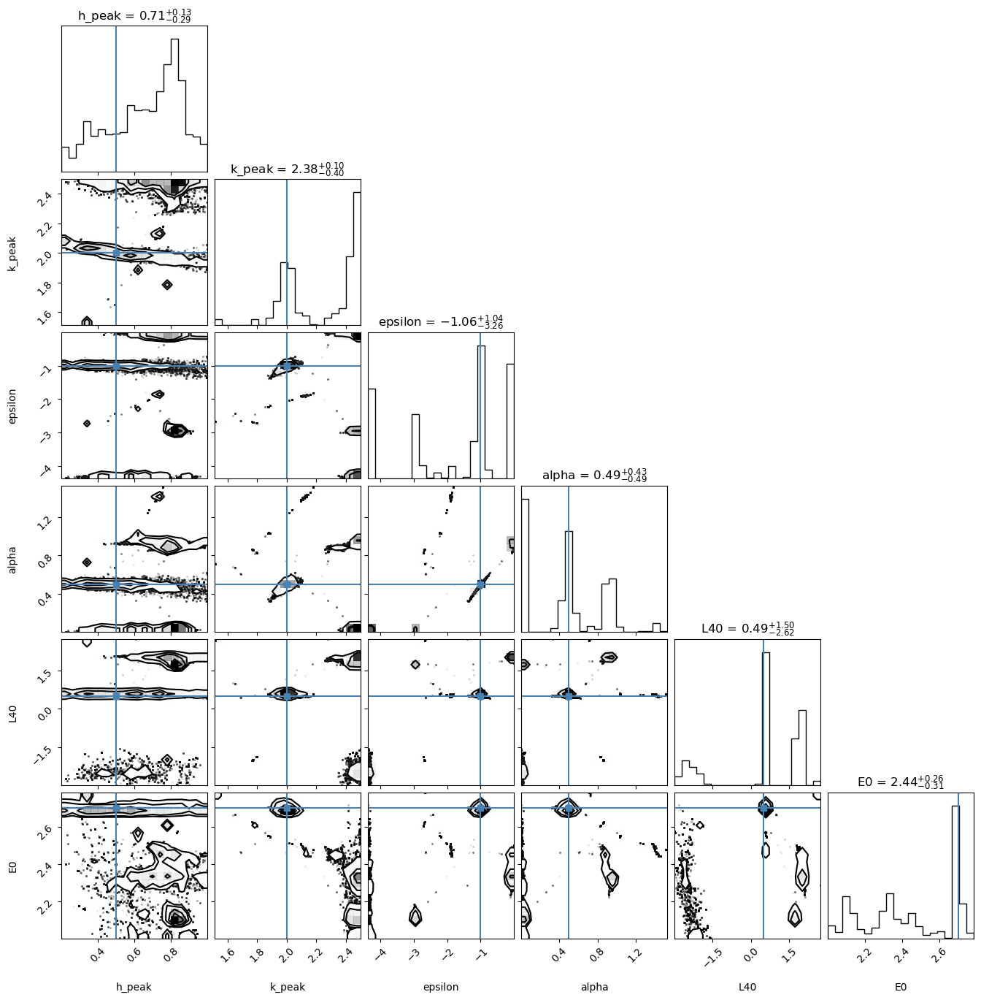

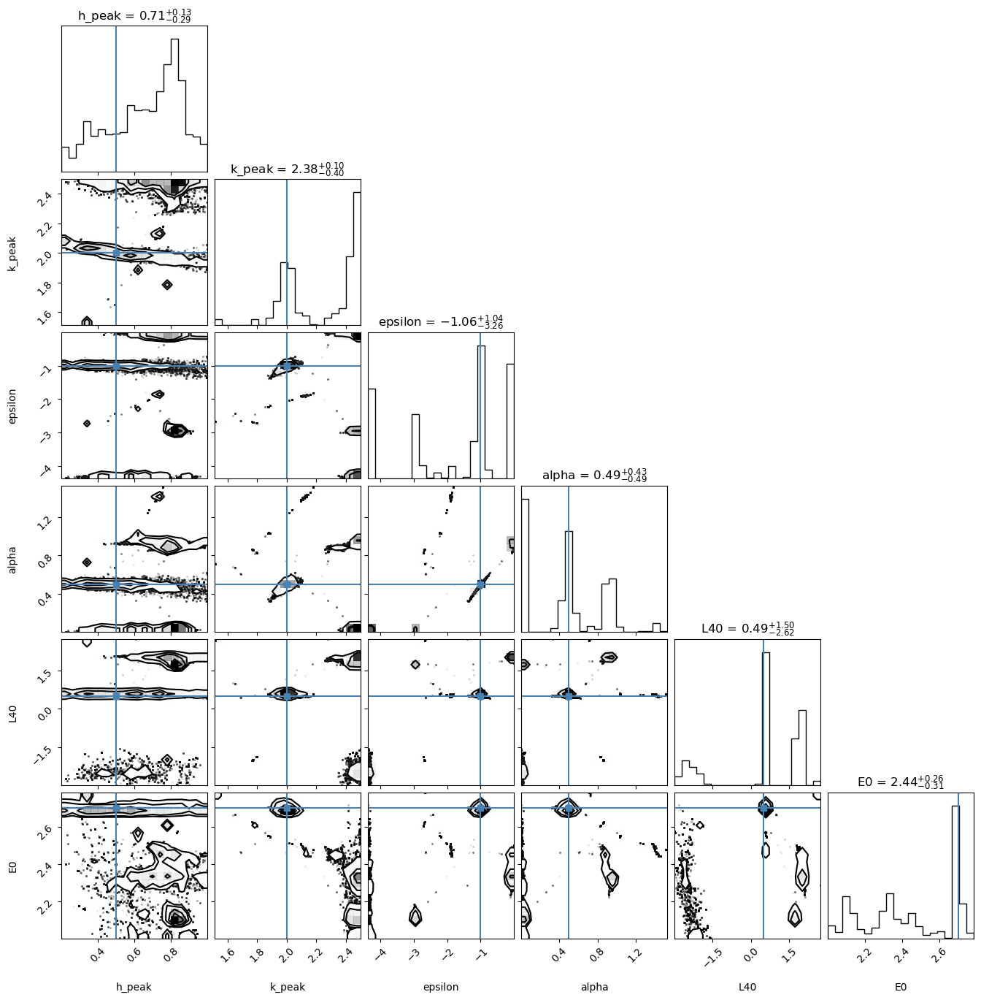

In [ ]:


n_burn = 800

def chain_plots(chain, parameter_labels, parameter_truths, **kwargs):
    """
    Plot the histories for each walker in the chain
    
    Parameters
    ----------
    chain: ndarray
        3D array with shape (n_walkers, n_steps, n_params)
    parameter_labels: list
        List of labels for each parameter
    parameter_truths: list
        List of true values for each parameter
    kwargs: `.Line2D` properties, optional
        All keyword arguments are passed to `pyplot.plot`
    """
    n_walkers, n_steps, n_params = chain.shape  # Calculate the number of parameters

    for param_idx in range(n_params):
        plt.figure()
        plt.plot(chain[n_burn:, :, param_idx], **kwargs)
        plt.axhline(y=parameter_truths[param_idx], color='k', linestyle='--', label='True value')
        plt.xlabel('Step Number')
        plt.ylabel(parameter_labels[param_idx])
        plt.title(f'Chain for {parameter_labels[param_idx]}')
        plt.legend()
        plt.show()  # Show the plot for each parameter

# Load the samples from the file
samples = np.load('samples_2023-09-01_15-47-46.npy')

# Define parameter labels and truth values
parameter_labels = ['h_peak', 'k_peak', 'epsilon', 'alpha', 'L40', 'E0']
parameter_truths = [0.5, 2, -1, 0.5, 0.477, 2.69897]

# Call the chain_plots function with the loaded samples and parameter information
chain_plots(samples, parameter_labels, parameter_truths)



# Load the saved chain
chain = samples

# Get the dimensions of the chain
num_walkers, num_samples, num_parameters = chain.shape

# Reshape the chain to combine walkers and samples
flatchain = chain[n_burn:,:,:].reshape(-1, num_parameters)

# Define labels for the parameters
parameter_labels = ['h_peak', 'k_peak', 'epsilon', 'alpha', 'L40', 'E0']

# Define truths for the parameters
parameter_truths = [0.5, 2, -1, 0.5, 0.477, 2.69897]

# Create a corner plot
corner.corner(flatchain, labels=parameter_labels, truths=parameter_truths, show_titles=True)



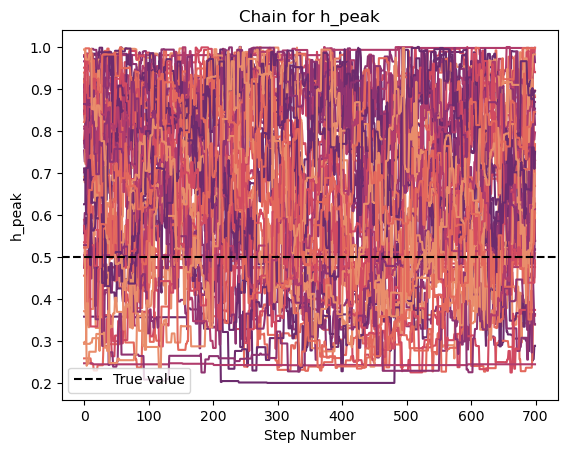

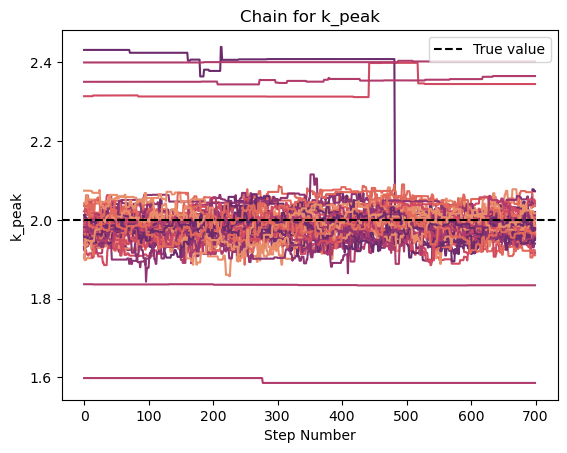

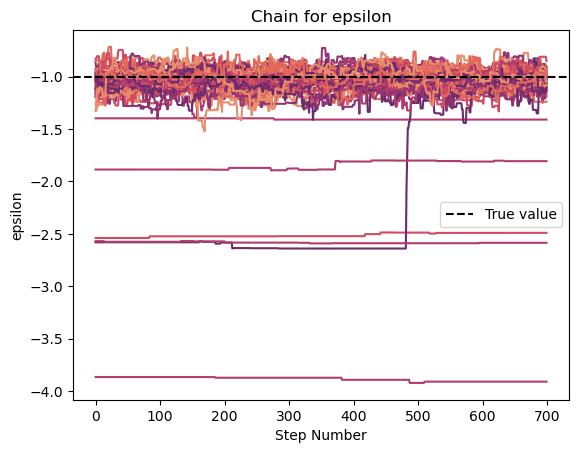

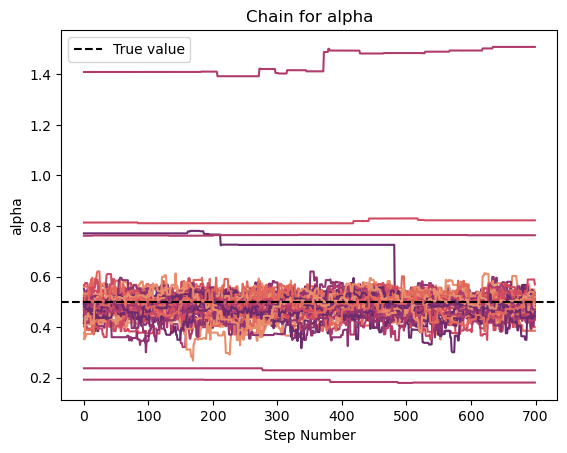

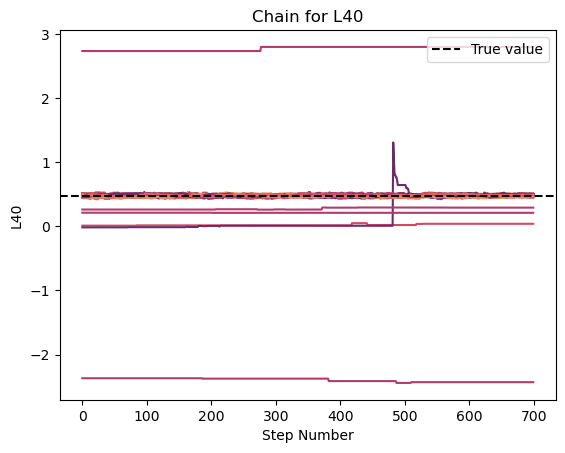

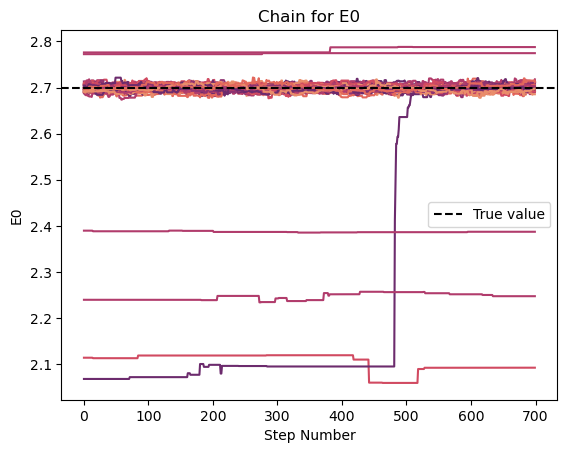

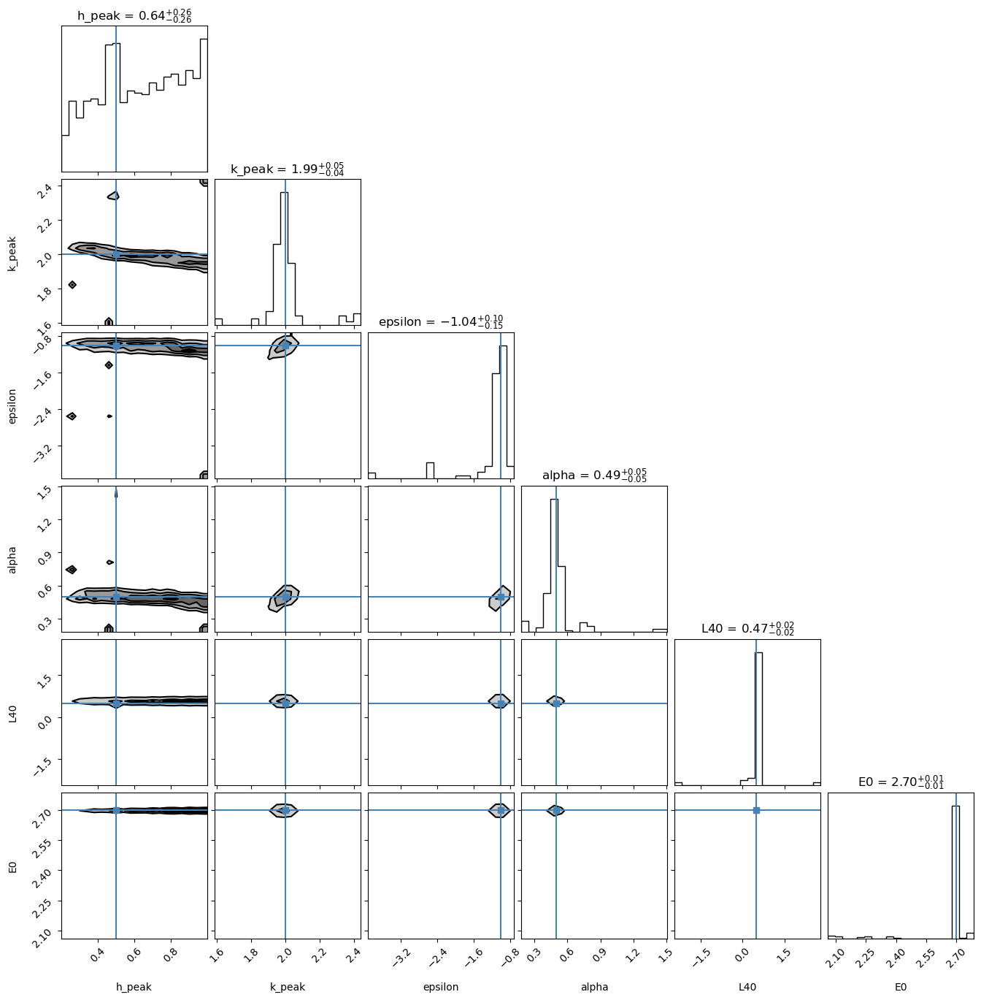

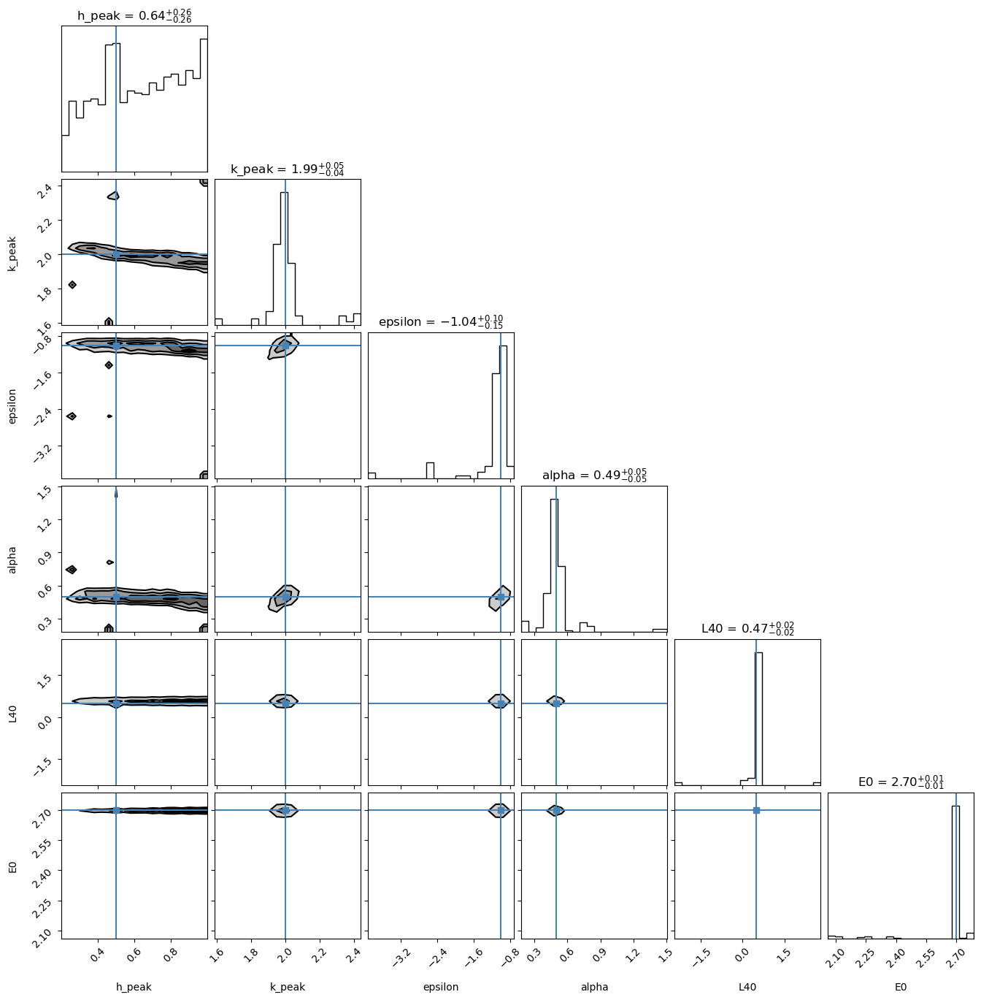

In [ ]:


n_burn = 800

def chain_plots(chain, parameter_labels, parameter_truths, **kwargs):
    """
    Plot the histories for each walker in the chain
    
    Parameters
    ----------
    chain: ndarray
        3D array with shape (n_walkers, n_steps, n_params)
    parameter_labels: list
        List of labels for each parameter
    parameter_truths: list
        List of true values for each parameter
    kwargs: `.Line2D` properties, optional
        All keyword arguments are passed to `pyplot.plot`
    """
    n_walkers, n_steps, n_params = chain.shape  # Calculate the number of parameters

    for param_idx in range(n_params):
        plt.figure()
        plt.plot(chain[n_burn:, :, param_idx], **kwargs)
        plt.axhline(y=parameter_truths[param_idx], color='k', linestyle='--', label='True value')
        plt.xlabel('Step Number')
        plt.ylabel(parameter_labels[param_idx])
        plt.title(f'Chain for {parameter_labels[param_idx]}')
        plt.legend()
        plt.show()  # Show the plot for each parameter

# Load the samples from the file
samples = np.load('samples_2023-08-31_14-17-52.npy')

# Define parameter labels and truth values
parameter_labels = ['h_peak', 'k_peak', 'epsilon', 'alpha', 'L40', 'E0']
parameter_truths = [0.5, 2, -1, 0.5, 0.477, 2.69897]

# Call the chain_plots function with the loaded samples and parameter information
chain_plots(samples, parameter_labels, parameter_truths)



# Load the saved chain
chain = samples

# Get the dimensions of the chain
num_walkers, num_samples, num_parameters = chain.shape

# Reshape the chain to combine walkers and samples
flatchain = chain[n_burn:,:,:].reshape(-1, num_parameters)

# Define labels for the parameters
parameter_labels = ['h_peak', 'k_peak', 'epsilon', 'alpha', 'L40', 'E0']

# Define truths for the parameters
parameter_truths = [0.5, 2, -1, 0.5, 0.477, 2.69897]

# Create a corner plot
corner.corner(flatchain, labels=parameter_labels, truths=parameter_truths, show_titles=True,plot_density = False, fill_contours = True, plot_datapoints = False)



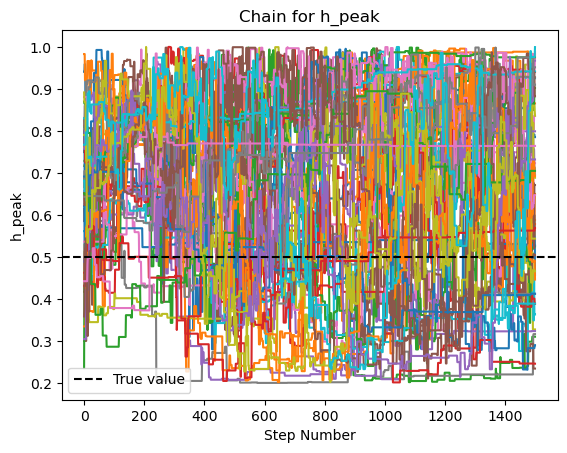

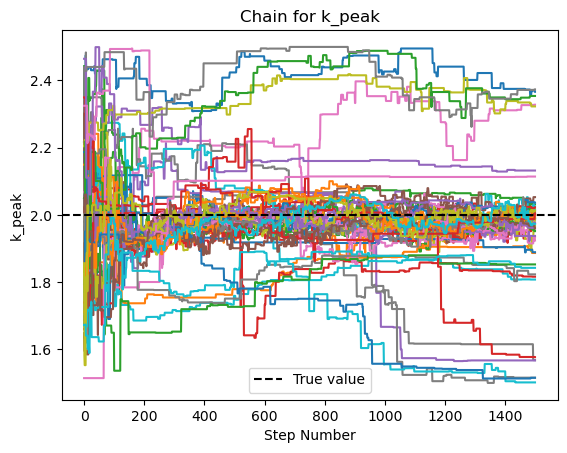

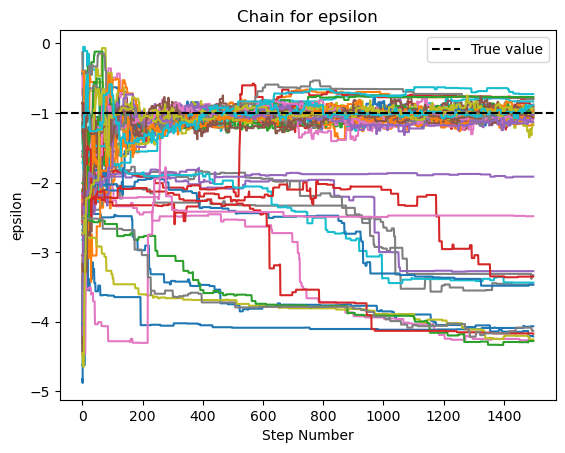

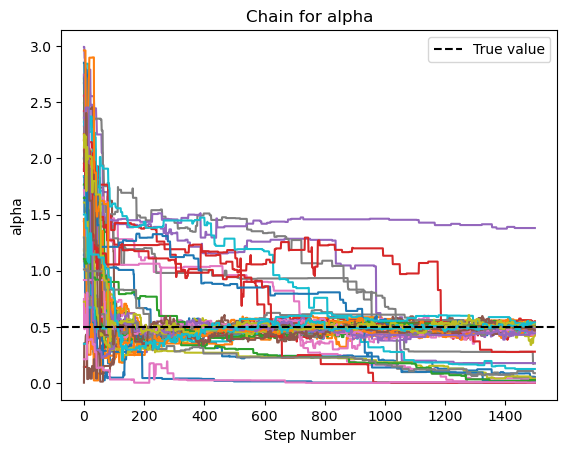

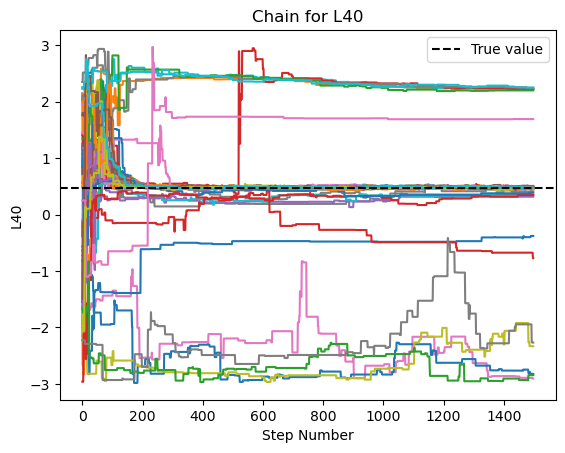

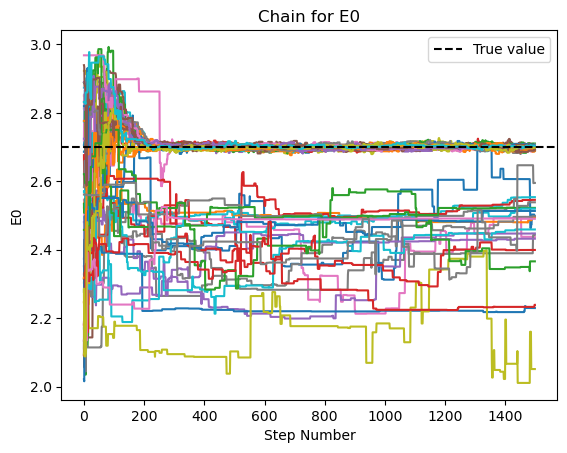

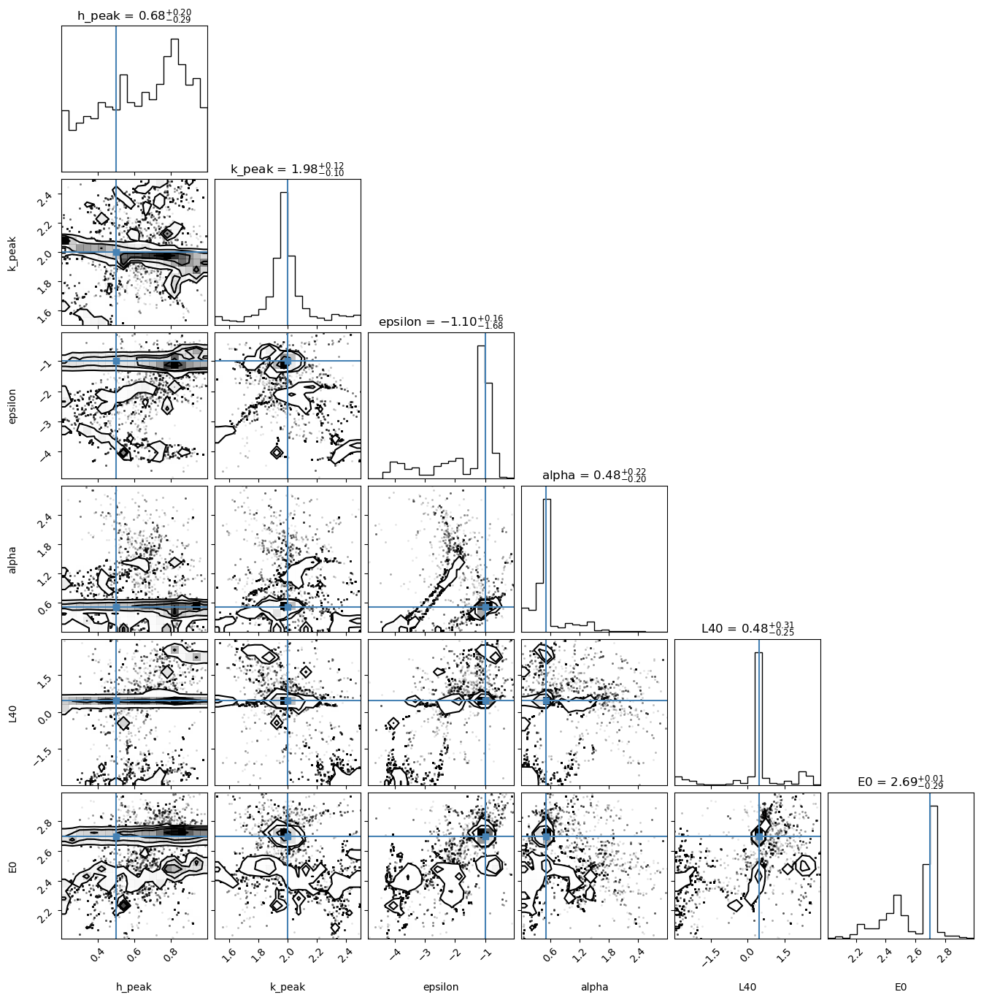

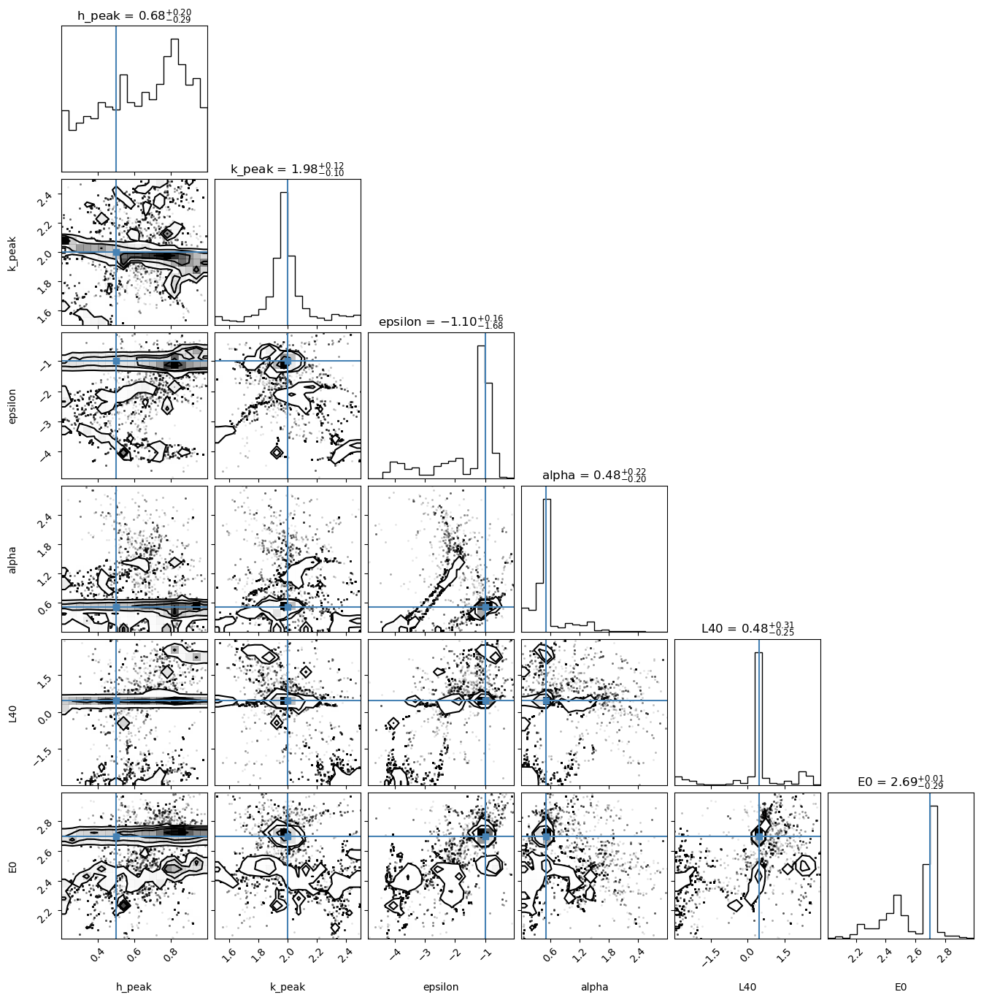

In [ ]:


n_burn = 1

def chain_plots(chain, parameter_labels, parameter_truths, **kwargs):
    """
    Plot the histories for each walker in the chain
    
    Parameters
    ----------
    chain: ndarray
        3D array with shape (n_walkers, n_steps, n_params)
    parameter_labels: list
        List of labels for each parameter
    parameter_truths: list
        List of true values for each parameter
    kwargs: `.Line2D` properties, optional
        All keyword arguments are passed to `pyplot.plot`
    """
    n_walkers, n_steps, n_params = chain.shape  # Calculate the number of parameters

    for param_idx in range(n_params):
        plt.figure()
        plt.plot(chain[n_burn:, :, param_idx], **kwargs)
        plt.axhline(y=parameter_truths[param_idx], color='k', linestyle='--', label='True value')
        plt.xlabel('Step Number')
        plt.ylabel(parameter_labels[param_idx])
        plt.title(f'Chain for {parameter_labels[param_idx]}')
        plt.legend()
        plt.show()  # Show the plot for each parameter

# Load the samples from the file
samples = np.load('samples_2023-08-31_14-13-31.npy')

# Define parameter labels and truth values
parameter_labels = ['h_peak', 'k_peak', 'epsilon', 'alpha', 'L40', 'E0']
parameter_truths = [0.5, 2, -1, 0.5, 0.477, 2.69897]

# Call the chain_plots function with the loaded samples and parameter information
chain_plots(samples, parameter_labels, parameter_truths)



# Load the saved chain
chain = samples

# Get the dimensions of the chain
num_walkers, num_samples, num_parameters = chain.shape

# Reshape the chain to combine walkers and samples
flatchain = chain[n_burn:,:,:].reshape(-1, num_parameters)

# Define labels for the parameters
parameter_labels = ['h_peak', 'k_peak', 'epsilon', 'alpha', 'L40', 'E0']

# Define truths for the parameters
parameter_truths = [0.5, 2, -1, 0.5, 0.477, 2.69897]

# Create a corner plot
corner.corner(flatchain, labels=parameter_labels, truths=parameter_truths, show_titles=True)

